# Определение музыкального жанра<br>по изображению обложки компакт-диска

Создание уникального и запоминающегося художественного образа для оформления обложки музыкального компакт-диска направлено на визуальное выделение альбома и привлечение внимания покупателей. Зрительный образ музыкального альбома может быть связан с музыкальным материалом: может передавать стиль музыкальных исполнителей и жанр, в котором написаны музыкальные композиции.

Обнаружение связи между оформлением обложки и музыкальным жанром альбома на компакт-диске может быть полезным при создании рекомендательных систем, когда по изображению альбома одного компакт-диска можно будет предложить другой альбом этого же жанра. Для нахождения такой связи и определения музыкального жанра компакт-диска по изображению его обложки можно использовать алгоритмы машинного обучения. Они могут анализировать визуальные признаки: распознавать цвета, формы и другие характеристики обложки, характерные для определённого жанра музыки.

В нашем распоряжении изображения в формате PNG, упакованные в zip-архивы. Имя архива соответствует музыкальному жанру. Каждый zip-архив содержит папку с изображениями музыкальных обложек соответствующего жанра.

**Цель проекта:** разработать модель, которая определит жанр музыкального альбома по изображению его обложки.

**Задачи проекта:**
- выполнить предобработку данных;
- провести описательный анализ данных;
- разбить данные на тренировочную и валидационную выборки;
- выбрать алгоритмы и построить модели;
- выбрать метрики качества моделей и оценить их значения.

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Обзор-данных" data-toc-modified-id="Обзор-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Обзор данных</a></span><ul class="toc-item"><li><span><a href="#Импорт-библиотек-и-предварительные-настройки" data-toc-modified-id="Импорт-библиотек-и-предварительные-настройки-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Импорт библиотек и предварительные настройки</a></span></li><li><span><a href="#Чтение-файлов-и-загрузка-данных" data-toc-modified-id="Чтение-файлов-и-загрузка-данных-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Чтение файлов и загрузка данных</a></span></li><li><span><a href="#Общая-характеристика-набора-данных" data-toc-modified-id="Общая-характеристика-набора-данных-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Общая характеристика набора данных</a></span></li></ul></li><li><span><a href="#Описание-данных" data-toc-modified-id="Описание-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Описание данных</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Обработка-аномальных-значений" data-toc-modified-id="Обработка-аномальных-значений-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Обработка аномальных значений</a></span></li><li><span><a href="#Обработка-дубликатов" data-toc-modified-id="Обработка-дубликатов-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Обработка дубликатов</a></span></li></ul></li><li><span><a href="#Построение-модели" data-toc-modified-id="Построение-модели-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Построение модели</a></span><ul class="toc-item"><li><span><a href="#Простая-модель" data-toc-modified-id="Простая-модель-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Простая модель</a></span><ul class="toc-item"><li><span><a href="#Извлечение-эмбеддингов" data-toc-modified-id="Извлечение-эмбеддингов-4.1.1"><span class="toc-item-num">4.1.1&nbsp;&nbsp;</span>Извлечение эмбеддингов</a></span></li><li><span><a href="#Разделение-данных-на-выборки" data-toc-modified-id="Разделение-данных-на-выборки-4.1.2"><span class="toc-item-num">4.1.2&nbsp;&nbsp;</span>Разделение данных на выборки</a></span></li><li><span><a href="#Обучение-модели" data-toc-modified-id="Обучение-модели-4.1.3"><span class="toc-item-num">4.1.3&nbsp;&nbsp;</span>Обучение модели</a></span></li><li><span><a href="#Оценка-модели" data-toc-modified-id="Оценка-модели-4.1.4"><span class="toc-item-num">4.1.4&nbsp;&nbsp;</span>Оценка модели</a></span><ul class="toc-item"><li><span><a href="#Обучение-на-сбалансированных-данных" data-toc-modified-id="Обучение-на-сбалансированных-данных-4.1.4.1"><span class="toc-item-num">4.1.4.1&nbsp;&nbsp;</span>Обучение на сбалансированных данных</a></span></li><li><span><a href="#Обучение-на-несбалансированных-данных" data-toc-modified-id="Обучение-на-несбалансированных-данных-4.1.4.2"><span class="toc-item-num">4.1.4.2&nbsp;&nbsp;</span>Обучение на несбалансированных данных</a></span></li></ul></li></ul></li><li><span><a href="#Нейронная-сеть" data-toc-modified-id="Нейронная-сеть-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Нейронная сеть</a></span><ul class="toc-item"><li><span><a href="#Извлечение-данных" data-toc-modified-id="Извлечение-данных-4.2.1"><span class="toc-item-num">4.2.1&nbsp;&nbsp;</span>Извлечение данных</a></span></li><li><span><a href="#Разделение-данных-на-выборки" data-toc-modified-id="Разделение-данных-на-выборки-4.2.2"><span class="toc-item-num">4.2.2&nbsp;&nbsp;</span>Разделение данных на выборки</a></span></li><li><span><a href="#Валидация" data-toc-modified-id="Валидация-4.2.3"><span class="toc-item-num">4.2.3&nbsp;&nbsp;</span>Валидация</a></span></li><li><span><a href="#Загрузчик-данных" data-toc-modified-id="Загрузчик-данных-4.2.4"><span class="toc-item-num">4.2.4&nbsp;&nbsp;</span>Загрузчик данных</a></span></li><li><span><a href="#Подбор-скорости-обучения" data-toc-modified-id="Подбор-скорости-обучения-4.2.5"><span class="toc-item-num">4.2.5&nbsp;&nbsp;</span>Подбор скорости обучения</a></span></li><li><span><a href="#Выбор-архитектуры-предобученной-нейронной-сети" data-toc-modified-id="Выбор-архитектуры-предобученной-нейронной-сети-4.2.6"><span class="toc-item-num">4.2.6&nbsp;&nbsp;</span>Выбор архитектуры предобученной нейронной сети</a></span><ul class="toc-item"><li><span><a href="#ResNet18" data-toc-modified-id="ResNet18-4.2.6.1"><span class="toc-item-num">4.2.6.1&nbsp;&nbsp;</span>ResNet18</a></span></li><li><span><a href="#ResNet34" data-toc-modified-id="ResNet34-4.2.6.2"><span class="toc-item-num">4.2.6.2&nbsp;&nbsp;</span>ResNet34</a></span></li><li><span><a href="#ResNet50" data-toc-modified-id="ResNet50-4.2.6.3"><span class="toc-item-num">4.2.6.3&nbsp;&nbsp;</span>ResNet50</a></span></li><li><span><a href="#ResNet101" data-toc-modified-id="ResNet101-4.2.6.4"><span class="toc-item-num">4.2.6.4&nbsp;&nbsp;</span>ResNet101</a></span></li><li><span><a href="#ResNet152" data-toc-modified-id="ResNet152-4.2.6.5"><span class="toc-item-num">4.2.6.5&nbsp;&nbsp;</span>ResNet152</a></span></li></ul></li><li><span><a href="#Использование-аугментации-изображений" data-toc-modified-id="Использование-аугментации-изображений-4.2.7"><span class="toc-item-num">4.2.7&nbsp;&nbsp;</span>Использование аугментации изображений</a></span><ul class="toc-item"><li><span><a href="#Аугментация-без-изменения-размера-изображения" data-toc-modified-id="Аугментация-без-изменения-размера-изображения-4.2.7.1"><span class="toc-item-num">4.2.7.1&nbsp;&nbsp;</span>Аугментация без изменения размера изображения</a></span></li><li><span><a href="#Аугментация-с-изменением-размера-изображения" data-toc-modified-id="Аугментация-с-изменением-размера-изображения-4.2.7.2"><span class="toc-item-num">4.2.7.2&nbsp;&nbsp;</span>Аугментация с изменением размера изображения</a></span></li></ul></li><li><span><a href="#Подбор-количества-эпох" data-toc-modified-id="Подбор-количества-эпох-4.2.8"><span class="toc-item-num">4.2.8&nbsp;&nbsp;</span>Подбор количества эпох</a></span></li><li><span><a href="#Выбор-функции-потерь" data-toc-modified-id="Выбор-функции-потерь-4.2.9"><span class="toc-item-num">4.2.9&nbsp;&nbsp;</span>Выбор функции потерь</a></span><ul class="toc-item"><li><span><a href="#LabelSmoothingCrossEntropy" data-toc-modified-id="LabelSmoothingCrossEntropy-4.2.9.1"><span class="toc-item-num">4.2.9.1&nbsp;&nbsp;</span>LabelSmoothingCrossEntropy</a></span></li><li><span><a href="#FocalLoss" data-toc-modified-id="FocalLoss-4.2.9.2"><span class="toc-item-num">4.2.9.2&nbsp;&nbsp;</span>FocalLoss</a></span></li></ul></li><li><span><a href="#Использование-замораживания-слоёв" data-toc-modified-id="Использование-замораживания-слоёв-4.2.10"><span class="toc-item-num">4.2.10&nbsp;&nbsp;</span>Использование замораживания слоёв</a></span></li><li><span><a href="#Обучение-на-сбалансированных-данных" data-toc-modified-id="Обучение-на-сбалансированных-данных-4.2.11"><span class="toc-item-num">4.2.11&nbsp;&nbsp;</span>Обучение на сбалансированных данных</a></span></li></ul></li><li><span><a href="#Оценка-модели" data-toc-modified-id="Оценка-модели-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Оценка модели</a></span></li></ul></li><li><span><a href="#Общий-вывод" data-toc-modified-id="Общий-вывод-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Общий вывод</a></span></li></ul></div>

*Внимание!* Для корректной работы кода в ячейках рекомендуется предварительно установить следующие библиотеки:

In [ ]:
!pip install faiss-cpu -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.0/27.0 MB 33.1 MB/s eta 0:00:00


## Обзор данных

### Импорт библиотек и предварительные настройки

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import sys
import torch
import faiss
import warnings

from zipfile import ZipFile, is_zipfile
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report,
                             confusion_matrix,
                             ConfusionMatrixDisplay,
                             accuracy_score)
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.transforms import v2
from fastai.vision.all import *

pd.set_option('display.max_columns', None)
np.set_printoptions(threshold=sys.maxsize)
warnings.filterwarnings('ignore')

set_seed(99, True)
RANDOM_STATE = 1
RANDOM_SEED = 1

### Чтение файлов и загрузка данных

Все изображения хранятся в десяти архивах, в каждом из которых расположена одна папка с файлами изображений. Название папки, как и название архива, соответствуют музыкальному жанру, к которому относятся компакт-диски, обложки которых представлены в папке.

Сформируем набор данных, в котором для каждого имени файла с изображением будут указаны музыкальный жанр альбома, размер и формат файла, размер изображения: длина и ширина, цветовой режим изображения.

In [ ]:
def load_images(path):
    '''
    Функция чтения файлов с изображениями
    и извлечения из них сведений.

    Принимает путь к папке с архивами,
    в которых хранятся изображения.
    Возвращает набор данных с извлечёнными сведениями
    об изображениях.
    '''


    dct = {'filename': [], 'genre': [], 'size': [], 'format': [],
           'height': [], 'width': [], 'mode': []}

    for file_name in os.listdir(path):
        if is_zipfile(f'{path}{file_name}'):
            with ZipFile(f'{path}{file_name}') as archive:

                for entry in archive.infolist()[1:]: # Индекс 0 соответствует имени папки
                    dct['filename'].append(entry.filename.split('/')[1])
                    dct['genre'].append(file_name[:-4]) # Имя архива - название жанра
                    dct['size'].append(entry.file_size)

                    with archive.open(entry) as file:
                        with Image.open(file) as image:

                            dct['format'].append(image.format)
                            dct['height'].append(image.height)
                            dct['width'].append(image.width)
                            dct['mode'].append(image.mode)

    data = pd.DataFrame(dct)

    return data

In [ ]:
PATHS = ['.\images\\', '/content/drive/MyDrive/images/']

def get_data(paths=PATHS):
    '''
    Функция для проверки существования пути к папке
    и вызова функции для формирования набора данных
    со сведениями об изображениях в папке.

    Принимает названия возможных путей.
    Возвращает набор данных со сведениями
    об изображениях и путь к папке.
    '''

    for path in paths:
        if os.path.exists(path[:-1]):
            file_path = path
            print('Loading was successfully completed')

            return load_images(file_path), file_path

    print('Something is wrong')

In [ ]:
data, path = get_data()

Loading was successfully completed


### Общая характеристика набора данных

In [ ]:
def df_info(data):
    '''
    Функция выводит описание набора данных,
    несколько строк набора данных,
    а также типы данных набора данных.

    Принимает набор исследуемых данных.
    '''

    display(data.sample(2))
    print('Размер набора данных:', data.shape)
    print('\nКоличество элементов данных:', data.size)
    print('\nКоличество пропущенных значений:',
          data.isna().sum().sum())
    print('\nТипы данных набора данных:')
    display(data.dtypes.value_counts())

In [ ]:
df_info(data)

,filename,genre,size,format,height,width,mode
6415,611f590b-879f-42d2-8996-06cbc21fb831.png,pop,81732,PNG,300,300,RGBA
820,aa34a566-329f-49b4-8965-a8b440298ef2.png,anime,207914,PNG,300,300,RGBA


Размер набора данных: (7800, 7)

Количество элементов данных: 54600

Количество пропущенных значений: 0

Типы данных набора данных:


object    4
int64     3
Name: count, dtype: int64

**Промежуточный вывод**

- Набор данных содержит 7 уникальных признаков и 7800 записей.
- Всего: 54 600 элементов данных.
- Набор данных содержит данные следующего типа:
    - целочисленный — 3 признака,
    - смешанный — 4 признака.
- Все признаки содержат значения (не являются пустыми).
- Все признаки не содержат пропущенные значения.

Выведем примеры изображений из каждой папки (с указанием музыкального жанра).


A N I M E


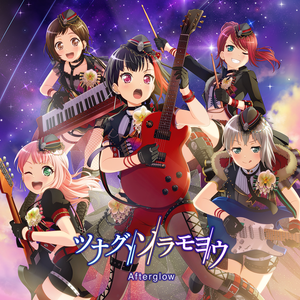


B L A C K   M E T A L


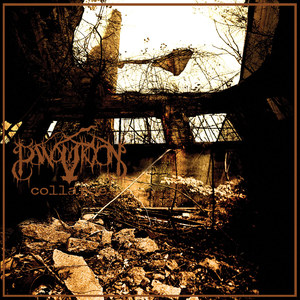


C L A S S I C A L


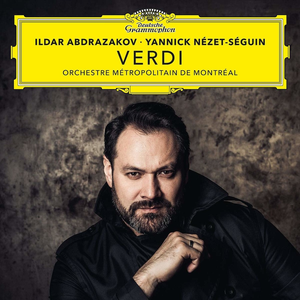


C O U N T R Y


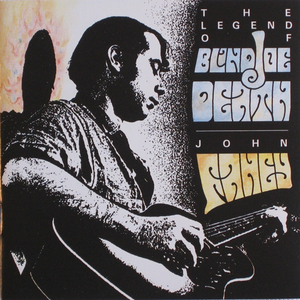


D I S C O


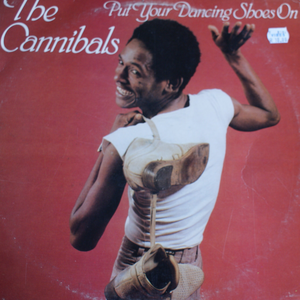


E D M


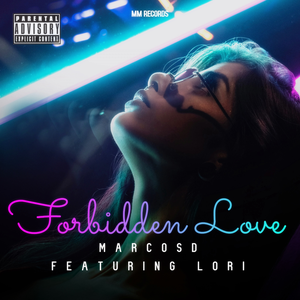


J A Z Z


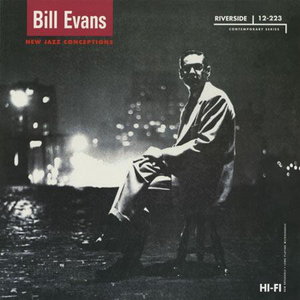


P O P


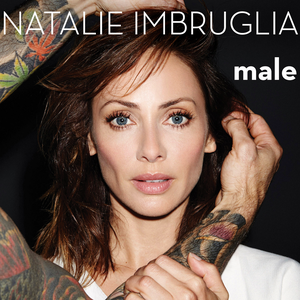


R A P


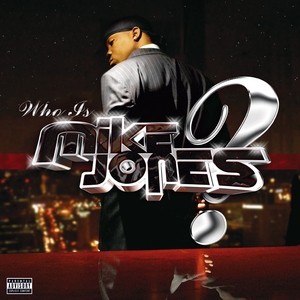


R E G G A E


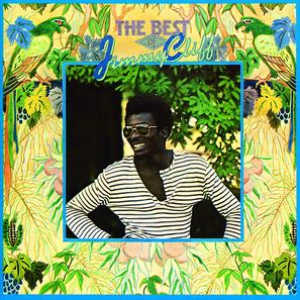

In [ ]:
for file_name in os.listdir(path):
    if is_zipfile(f'{path}{file_name}'):
        genre_name = file_name[:-4]

        print('\n' + '=' * 39)
        print(' '.join(list(genre_name.upper())))

        with ZipFile(f'{path}{file_name}') as archive:
            for entry in data.loc[data['genre'] == genre_name, 'filename'].sample():
                with archive.open(f'{genre_name}/{entry}') as file:

                    display(Image.open(file))

## Описание данных

Посмотрим на характеристики распределений значений признаков.

In [ ]:
data.describe(include='all').fillna('')

,filename,genre,size,format,height,width,mode
count,7800,7800,7800.0,7800,7800.0,7800.0,7800
unique,7796,10,,2,,,2
top,6ea3d2de-f234-4bdd-8ba8-4e9523f5ae1a.png,country,,PNG,,,RGBA
freq,2,1486,,7797,,,7797
mean,,,161171.728205,,300.0,300.0,
std,,,40393.251247,,0.0,0.0,
min,,,15792.0,,300.0,300.0,
25%,,,134670.5,,300.0,300.0,
50%,,,164310.0,,300.0,300.0,
75%,,,189490.0,,300.0,300.0,


`filename` &mdash; название файла
<br>Признак является категориальным, номинальным.
<br>Шкала измерения признака: номинальная шкала.
<br>Всего значений &mdash; 7800, среди них уникальных &mdash; 7796. Следовательно, существуют дубликаты наименований файлов. Возможно, что это также дубликаты изображений.

`format` &mdash; формат файла
<br>Признак является категориальным, номинальным.
<br>Шкала измерения признака: номинальная шкала.
<br>Среди 7800 файлов 7797 имеют формат PNG, а 3 файла имеют формат GIF (смотри таблицу частот ниже).

In [ ]:
data['format'].value_counts()

format
PNG    7797
GIF       3
Name: count, dtype: int64

`mode` &mdash; цветовой режим изображения
<br>Признак является категориальным, номинальным.
<br>Шкала измерения признака: номинальная шкала.
<br> Среди 7800 изображений цветовой режим RGBA имеют 7797 изображений, а 3 изображения имеют цветовой формат P (смотри таблицу частот ниже).

**Режим изображения** &mdash; это строка, определяющая тип и глубину пикселя изображения. Каждый пиксель использует весь диапазон битовой глубины. Таким образом, 1-битный пиксель имеет диапазон от 0 до 1, 8-битный пиксель имеет диапазон от 0 до 255.
<br>Цветовой режим RGBA: пиксели 4$\times$8 бит, true color с каналом прозрачности (альфа-канал).
<br>Цветовой режим P: 8-битные пиксели, сопоставленные с любым другим режимом с использованием цветовой палитры.

In [ ]:
data['mode'].value_counts()

mode
RGBA    7797
P          3
Name: count, dtype: int64

`genre` &mdash; музыкальный жанр &mdash; целевая переменная
<br>Признак является категориальным, номинальным.
<br>Шкала измерения признака: номинальная шкала.
<br>7800 изображений распределены между 10 музыкальными жанрами. На каждый жанр приходится разное количество изображений. Наблюдается дисбаланс классов. Наиболее часто встречаются изображения обложек музыкальных дисков в жанрах country (1486 изображений) и anime (1189 изображений). Реже всех можно найти изображения обложек музыкальных дисков в жанре rap (328 изображений).

In [ ]:
data['genre'].value_counts()

genre
country        1486
anime          1189
classical       955
jazz            821
pop             803
edm             719
reggae          581
disco           468
black metal     450
rap             328
Name: count, dtype: int64

`size` &mdash; размер файла, байт
<br>Признак является количественным, дискретным.
<br>Шкала измерения признака: абсолютная шкала.
<br>Значения признака распределены непрерывно. Минимальное значений &mdash; 15 792 байт, максимальное &mdash; 284 731 байт. Медиана 164 310 байт и среднее арифметическое 161 172 байт расположены близко.

`height`, `width` &mdash; длина, ширина изображения
<br>Признак является количественным, дискретным.
<br>Шкала измерения признака: абсолютная шкала.
<br>Все изображения являются квадратными: длина и ширина составляют 300 пикселей.

## Предобработка данных

### Обработка аномальных значений

Среди PNG-изображений имеются 3 GIF-изображения. Эти GIF-изображения имеют цветовой режим P.

In [ ]:
data[data['format'] == 'GIF']

,filename,genre,size,format,height,width,mode
1728,1a4a29f5-5242-461a-8269-fe7b9914f7c3.png,classical,92058,GIF,300,300,P
2545,f6135239-aad2-4a03-80c5-b8bebc5d990b.png,classical,52382,GIF,300,300,P
4490,c69fb1bf-7df3-4551-8bcf-a933ea78acb2.png,disco,96276,GIF,300,300,P


Посмотрим на GIF-изображения.

1a4a29f5-5242-461a-8269-fe7b9914f7c3.png


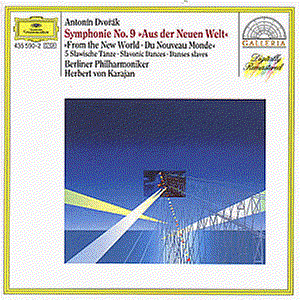

f6135239-aad2-4a03-80c5-b8bebc5d990b.png


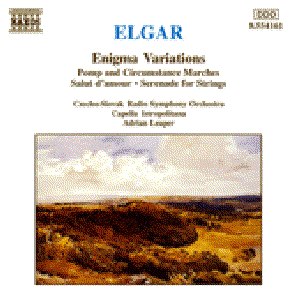

c69fb1bf-7df3-4551-8bcf-a933ea78acb2.png


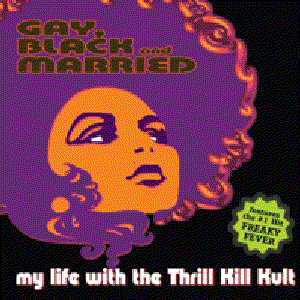

In [ ]:
for row in data[data['format'] == 'GIF'].index:

    genre_name = data.loc[row, 'genre']
    file_name = data.loc[row, 'filename']

    with ZipFile(f'{path}{genre_name}.zip') as archive:
        with archive.open(f'{genre_name}/{file_name}') as file:

            print(file_name)
            display(Image.open(file))

Очевидно, что наличие этих изображений является аномалией: изображения могли случайно попасть в выборку при отборе изображений и формировании выборки. Удалим записи об этих изображениях из набора данных.

In [ ]:
data.drop(data[data['format'] == 'GIF'].index, axis=0, inplace=True)

len(data[data['format'] == 'GIF'])

0

In [ ]:
data.shape

(7797, 7)

### Обработка дубликатов

Полных дубликатов среди записей набора данных нет.

Кандидатами в дубли являются изображения, которые имеют одинаковое имя файла. Таких файлов 8. Записи, относящиеся к кандидатам в дубли, отличаются только значением музыкального жанра.

In [ ]:
data[data['filename'].duplicated(keep=False)].sort_values(by='filename')

,filename,genre,size,format,height,width,mode
4282,5c4f2c7c-8412-39fa-9468-23c52e285cd7.png,disco,150029,PNG,300,300,RGBA
7505,5c4f2c7c-8412-39fa-9468-23c52e285cd7.png,reggae,150029,PNG,300,300,RGBA
4326,6ea3d2de-f234-4bdd-8ba8-4e9523f5ae1a.png,disco,148802,PNG,300,300,RGBA
6462,6ea3d2de-f234-4bdd-8ba8-4e9523f5ae1a.png,pop,148802,PNG,300,300,RGBA
6529,7e5955d3-c4f3-493c-a3d4-8b855bfc1833.png,pop,153558,PNG,300,300,RGBA
7088,7e5955d3-c4f3-493c-a3d4-8b855bfc1833.png,rap,153558,PNG,300,300,RGBA
6603,9123d325-bf8e-4423-be98-98478dccee20.png,pop,175917,PNG,300,300,RGBA
7117,9123d325-bf8e-4423-be98-98478dccee20.png,rap,175917,PNG,300,300,RGBA


Посмотрим на изображения кандидатов в дубли.

Жанр: disco
Файл: 5c4f2c7c-8412-39fa-9468-23c52e285cd7.png


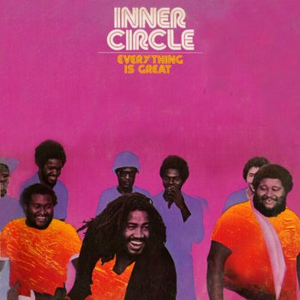

Жанр: reggae
Файл: 5c4f2c7c-8412-39fa-9468-23c52e285cd7.png


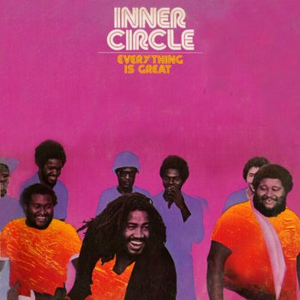

Жанр: disco
Файл: 6ea3d2de-f234-4bdd-8ba8-4e9523f5ae1a.png


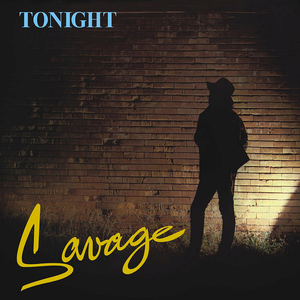

Жанр: pop
Файл: 6ea3d2de-f234-4bdd-8ba8-4e9523f5ae1a.png


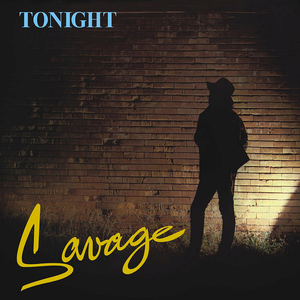

Жанр: pop
Файл: 7e5955d3-c4f3-493c-a3d4-8b855bfc1833.png


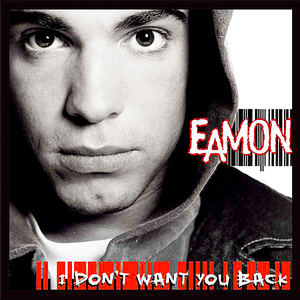

Жанр: rap
Файл: 7e5955d3-c4f3-493c-a3d4-8b855bfc1833.png


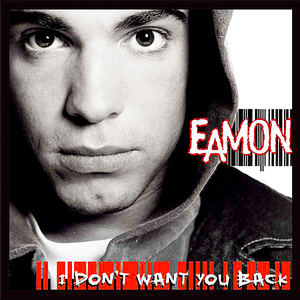

Жанр: pop
Файл: 9123d325-bf8e-4423-be98-98478dccee20.png


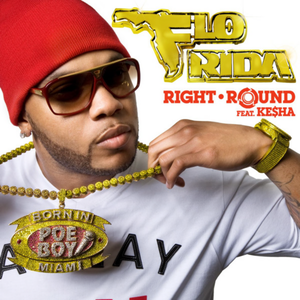

Жанр: rap
Файл: 9123d325-bf8e-4423-be98-98478dccee20.png


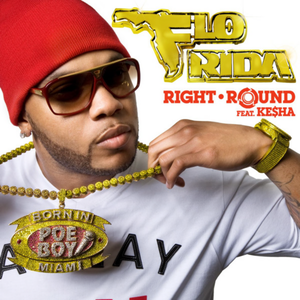

In [ ]:
for row in data[data['filename'].duplicated(keep=False)].sort_values(by='filename').index:
    genre_name = data.loc[row, 'genre']
    file_name = data.loc[row, 'filename']
    with ZipFile(f'{path}{genre_name}.zip') as archive:
        with archive.open(f'{genre_name}/{file_name}') as file:
            print(f'Жанр: {genre_name}\nФайл: {file_name}')
            display(Image.open(file))

Поскольку мы не можем однозначно соотнести изображения обложек дисков с музыкальным жанром (либо эти музыкальные альбомы одновременно относятся к разным музыкальным жанрам), записи о них необходимо удалить из набора данных.

In [ ]:
data.drop_duplicates(subset='filename', keep=False, inplace=True)

len(data[data['filename'].duplicated(keep=False)])

0

In [ ]:
data.shape

(7789, 7)

Помимо найденных частичных дубликатов кандидатами в дубли могут оказаться изображения, файлы которых имеют одинаковый размер. Такие файлы могут иметь разное имя, но находиться в одной папке (соответствовать одному музыкальному жанру), либо располагаться в разных папках (соответствовать разным музыкальным жанрам).

Для упрощения поиска кандидатов в дубли дополним набор данных сдвоенным признаком "размер файла&mdash;музыкальный жанр".

In [ ]:
data['size_genre'] = data['size'].astype('str') + '_' + data['genre']
data.head()

,filename,genre,size,format,height,width,mode,size_genre
0,00095702-6b86-4bb1-880e-1e09e759a013.png,anime,228202,PNG,300,300,RGBA,228202_anime
1,0091bee3-a67a-457e-8c5f-b4a1055b1211.png,anime,96792,PNG,300,300,RGBA,96792_anime
2,00a9d688-337f-4807-83cd-596540f1683b.png,anime,168296,PNG,300,300,RGBA,168296_anime
3,00ddb3de-75db-4e27-ad3d-441a5dc95636.png,anime,210657,PNG,300,300,RGBA,210657_anime
4,00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png,anime,171638,PNG,300,300,RGBA,171638_anime


Сначала найдём файлы одинакового размера, лежащие в одной папке. Таких кандидатов в дубли 123.

In [ ]:
data_duplicated = data[data['size_genre'].duplicated(keep=False)].sort_values(by='size_genre')

len(data_duplicated)

123

Посмотрим на них.

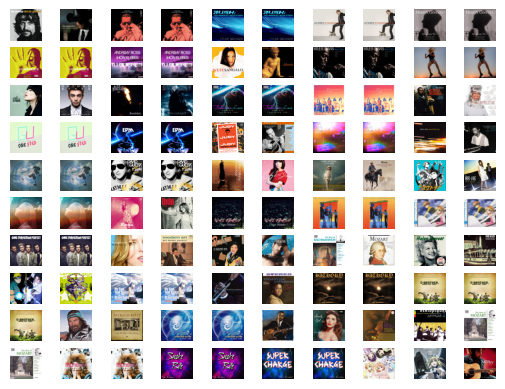

<Figure size 2000x2000 with 0 Axes>

In [ ]:
fig, axes = plt.subplots(nrows=10, ncols=10)
fig = plt.figure(figsize=(20, 20))

i = 0
for row in data_duplicated[:100].index:
    genre_name = data.loc[row, 'genre']
    file_name = data.loc[row, 'filename']
    with ZipFile(f'{path}{genre_name}.zip') as archive:
        with archive.open(f'{genre_name}/{file_name}') as file:
            img = Image.open(file)
            ax = axes.flat[i]
            ax.imshow(img)
            ax.set_axis_off()
            ax.set_frame_on(False)
            i += 1
plt.show()

Очевидно, что среди кандидатов в дубли есть частичные дубликаты. Однако не все файлы с одинаковым размером, лежащие в одной папке, являются дубликатами. Чтобы отобрать частичные дубликаты необходимо провести ручную разметку.

С помощью кода, приведённого ниже, была произведена ручная разметка кандидатов в дубли, лежащих в одной папке.

```python
ans = []
entries = []

for entry in data_duplicated['size_genre'].unique():
    df = data[data['size_genre'] == entry]
    fig, axes = plt.subplots(nrows=1, ncols=len(df))
    fig = plt.figure(figsize=(20, 20))

    i = 0
    for row in df.index:
        genre_name = data.loc[row, 'genre']
        file_name = data.loc[row, 'filename']
        with ZipFile(f'{path}{genre_name}.zip') as archive:
            with archive.open(f'{genre_name}/{file_name}') as file:
                img = Image.open(file)
                ax = axes.flat[i]
                ax.imshow(img)
                ax.set_axis_off()
                ax.set_frame_on(False)
                i += 1
    plt.show()
    ans.append(bool(int(input())))
    entries.append(entry)
```

Было получено два списка: список логических значений результата разметки (True &mdash; изображения являются дубликатами) и список уникальных значений "размер файла&mdash;название музыкального жанра" кандидатов в дубли.

In [ ]:
ans = [False, True, True, True, True, True, True, False, True,
       True, False, False, True, True, False, True, True, False,
       True, False, True, True, False, False, False, True, False,
       True, True, True, True, False, False, False, False, False,
       True, False, True, True, False, True, False, False, True,
       True, True, True, False, True, True, False, True, True,
       False, True, True, True, True, True]

entries = ['106494_country', '110327_jazz', '111127_edm', '111383_pop',
           '111417_classical', '119146_disco', '120264_edm', '123366_pop',
           '124347_jazz', '128200_pop', '128241_pop', '132184_black metal',
           '134772_edm', '134967_edm', '137610_jazz', '139190_edm',
           '140302_edm', '144615_jazz', '146043_edm', '146312_jazz',
           '148898_anime', '149759_edm', '150564_pop', '150998_country',
           '155630_anime', '158776_edm', '158985_pop', '159820_edm',
           '162875_disco', '163162_anime', '167236_pop', '168512_jazz',
           '168950_country', '169853_classical', '170293_jazz', '170729_anime',
           '171320_anime', '172402_jazz', '174085_black metal', '174387_country',
           '175042_country', '175140_edm', '177908_jazz', '183193_jazz',
           '183966_classical', '187149_edm', '189611_edm', '195895_edm',
           '196591_anime', '201874_reggae', '204853_anime', '207310_anime',
           '214200_anime', '217891_country', '218573_reggae', '221667_classical',
           '67742_edm', '72925_pop', '80355_edm', '81805_edm']

Всего было размечено 60 случаев возможного появления дубликатов среди изображений, имеющих одинаковый размер файла, которые лежат в одной папке (соотносятся с одним музыкальным жанром).

In [ ]:
len(entries)

60

Среди них в 37 случаях действительно появились частичные дубликаты. Появление одинаковых изображений с разными именами в одной папке могло быть вызвано ошибкой копирования/сохранения данных при подготовке выборки.

In [ ]:
duplicated_entries = pd.Series(entries)[ans]

len(duplicated_entries)

37

23 случая не являлись дубликатами. Случайно совпало, что файлы разных изображений в одной папке имели одинаковый размер.

In [ ]:
not_ans = [not x for x in ans]
not_duplicated_entries = pd.Series(entries)[not_ans]

len(not_duplicated_entries)

23

Передадим записи о файлах, не являющихся дубликатами, во временный набор данных.

In [ ]:
temp_df = pd.DataFrame()

for entry in not_duplicated_entries:
    temp_df = pd.concat([temp_df, data[data['size_genre'] == entry]])

len(temp_df)

46

Сформируем временный набор данных с записями об изображениях, для которых существуют дубликаты в той же папке, но под другим именем. Поскольку для этих изображений однозначно соотнесён музыкальный жанр, совсем удалять их из выборки нет оснований. Будут удалены только их копии.

In [ ]:
df = pd.DataFrame()

for entry in duplicated_entries:
    rows = data[data['size_genre'] == entry]
    df = pd.concat([df, rows.drop_duplicates(subset='size_genre')])

len(df)

37

Теперь необходимо удалить из основного набора данных записи о всех кандидатах в дубли по признаку "размер файла&mdash;музыкальный жанр".

In [ ]:
data.shape

(7789, 8)

In [ ]:
data.drop_duplicates(subset='size_genre', keep=False, inplace=True)

len(data[data['size_genre'].duplicated(keep=False)])

0

In [ ]:
data.shape

(7666, 8)

А теперь вернём записи о файлах, которые не являлись дубликатами, и о файлах, для которых были найдены изображения-копии.

In [ ]:
data = pd.concat([data, temp_df, df])

data.shape

(7749, 8)

Теперь необходимо проверить изображения на наличие кандидатов в дубли среди файлов одинакового размера, но не обязательно расположенных в одной папке. Таких кандидатов в дубли 425.

In [ ]:
data_duplicated2 = data[data['size'].duplicated(keep=False)].sort_values(by='size')

len(data_duplicated2)

425

Чтобы отобрать частичные дубликаты необходимо провести ручную разметку.

С помощью кода, приведённого ниже, была произведена ручная разметка кандидатов в дубли, лежащих в одной папке.

```python
ans2 = []
entries2 = []

for entry in data_duplicated2['size'].unique():
    df = data[data['size'] == entry]
    fig, axes = plt.subplots(nrows=1, ncols=len(df))
    fig = plt.figure(figsize=(20, 20))

    i = 0
    for row in df.index:
        genre_name = data.loc[row, 'genre']
        file_name = data.loc[row, 'filename']
        with ZipFile(f'{path}{genre_name}.zip') as archive:
            with archive.open(f'{genre_name}/{file_name}') as file:
                img = Image.open(file)
                ax = axes.flat[i]
                ax.imshow(img)
                ax.set_axis_off()
                ax.set_frame_on(False)
                i += 1
    plt.show()
    ans2.append(bool(int(input())))
    entries2.append(entry)
```

Было получено два списка: список логических значений результата разметки (True — изображения являются дубликатами) и список уникальных значений размера файла кандидатов в дубли.

In [ ]:
ans2 = [False, True, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, True, False,
        False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, True, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, True, False, False, False, False,
        False, True, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,
        False, False, False, False, False, True, False, False,
        False, False, False, False, False, False]

entries2 = [82749, 87644, 95392, 97658, 99790, 102624, 106494,
            111524, 113105, 113653, 115390, 118691, 119257, 119977,
            120233, 120855, 120911, 121662, 123366, 123805, 124054,
            125717, 125844, 127244, 127295, 128241, 129224, 129698,
            131508, 132184, 134087, 135690, 137059, 137610, 138735,
            139344, 141638, 142329, 142684, 143779, 143986, 144571,
            144615, 144681, 144847, 145925, 145963, 146071, 146312,
            146417, 147546, 147818, 148597, 149168, 149550, 149592,
            149692, 149835, 149880, 150500, 150546, 150564, 150810,
            150998, 151224, 151299, 151442, 151865, 152140, 152667,
            152881, 153045, 153786, 153873, 154108, 154446, 155023,
            155059, 155439, 155630, 155651, 155752, 158785, 158978,
            158985, 159563, 159589, 159768, 159775, 160935, 161081,
            161877, 162277, 162574, 162888, 164017, 164750, 165357,
            165980, 167247, 167555, 168226, 168227, 168512, 168517,
            168582, 168771, 168950, 169352, 169819, 169853, 170293,
            170578, 170729, 171228, 171513, 171891, 171922, 171974,
            172402, 172556, 172683, 173504, 173997, 174344, 174570,
            175023, 175042, 175251, 175319, 175901, 176406, 176420,
            176529, 176947, 177632, 177908, 178482, 178678, 178744,
            178790, 179334, 179621, 180030, 180075, 180282, 180496,
            180926, 181015, 181165, 181305, 181700, 182001, 182047,
            182237, 182369, 183193, 183681, 184007, 184387, 184673,
            184837, 186294, 187219, 188335, 188596, 188622, 190146,
            190159, 190669, 192741, 192801, 192905, 195077, 195450,
            195577, 196288, 196591, 196817, 196999, 197320, 198052,
            199744, 202553, 202985, 203011, 203373, 203804, 206057,
            207310, 208506, 208555, 209519, 210089, 211527, 212015,
            212770, 212791, 214138, 214969, 217654, 218438, 218573,
            220595, 223259, 231794]

Всего было размечено 206 случаев возможного появления дубликатов среди изображений, имеющих одинаковый размер файла.

In [ ]:
len(entries2)

206

Среди них в 8 случаях действительно появились частичные дубликаты. Появление одинаковых изображений в разных папках могло быть вызвано ошибкой копирования/сохранения данных при подготовке выборки, либо эти изображения соотносятся с альбомами, одновременно относящихся к разным музыкальным жанрам.

In [ ]:
duplicated_entries2 = pd.Series(entries2)[ans2]
len(duplicated_entries2)

8

Поскольку мы не можем однозначно соотнести изображения обложек дисков с музыкальным жанром в этих 8 случаях, записи об этих изображениях необходимо удалить.

In [ ]:
for entry in duplicated_entries2:
    data.drop(data[data['size'] == entry].index, axis=0, inplace=True)

data.shape

(7733, 8)

*Последние приготовления*

Проиндексируем записи набора данных новыми, последовательными числовыми значениями.

In [ ]:
data.reset_index(drop=True, inplace=True)
data.tail()

,filename,genre,size,format,height,width,mode,size_genre
7728,481ff771-2960-4a2c-a0ad-6b91b872e32d.png,classical,221667,PNG,300,300,RGBA,221667_classical
7729,0ea7b200-e67b-40e3-8e01-6075433b00b7.png,edm,67742,PNG,300,300,RGBA,67742_edm
7730,1b4f8392-566f-48eb-9c79-da2d02e7d74a.png,pop,72925,PNG,300,300,RGBA,72925_pop
7731,0d6f235e-354a-4446-806f-703513a6dcf0.png,edm,80355,PNG,300,300,RGBA,80355_edm
7732,3d482d4a-82d3-4834-919c-296aba0ced2f.png,edm,81805,PNG,300,300,RGBA,81805_edm


**Промежуточный вывод**

- Выполнена предварительная обработка данных.
- В результате предварительной обработки данных:
    - обработаны аномальные значения,
    - обнаружены и удалены частичные дубликаты &mdash; записи, для которых однозначно не определён музыкальный жанр,
    - сохранено 99,1 % записей исходного набора данных.

## Построение модели

Поскольку признак `genre` &mdash; категориальный, номинальный, следовательно, необходимо решить задачу многоклассовой классификации.

Для контроля качества обучаемых моделей будем использовать метрики: правильность, точность, полнота, F1-мера.

В качестве базовой модели будем использовать модель, использующую алгоритм поиска ближайших соседей. Предсказания на тестовой выборке будем выполнять одним ближайшим соседом.

В качестве основной модели будем использовать нейронную сеть, основанную на остатке предобученной на ImageNet свёрточной нейронной сети ResNet.

### Простая модель

$Простая\ модель = Простая\ логика + Простой\ код + Быстрый\ результат$

Метод ближайшего соседа не требует сложных вычислений и обучения модели. Он основан на принципе поиска среди всех наблюдений наиболее похожего на данное наблюдение. Простота и лёгкость реализации этого метода на практике делают его удобным для быстрой оценки качества простого предсказания. Кроме того, метод является применимым в задаче многоклассовой классификации в случае, когда классы представлены не одинаково (наблюдается дисбаланс классов).

In [ ]:
genres = [file[:-4] for file in os.listdir(path) if is_zipfile(f'{path}{file}')]
genres

['anime',
 'black metal',
 'classical',
 'country',
 'disco',
 'edm',
 'jazz',
 'pop',
 'rap',
 'reggae']

#### Извлечение эмбеддингов

Предварительно обработаем изображения: выполним их векторизацию (извлечём эмбеддинги). Для этого используем остаток предобученной нейронной сети ResNet50. Приведём числовые значения в сформированных векторах к типу данных float32, а векторы к длине 2048 &mdash; всё это выполнение требований ко входным данным, подаваемым алгоритму для поиска ближайших соседей средствами библиотеки faiss.

In [ ]:
model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
layer = model._modules.get('avgpool')
model.eval()

transform = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(torch.uint8, scale=True),
    v2.RandomResizedCrop(size=(224, 224), antialias=True),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def get_vector(image):

    t_img = transform(image)
    my_embedding = torch.zeros(2048)

    def copy_data(module, args, output):
        my_embedding.copy_(output.flatten())

    h = layer.register_forward_hook(copy_data)

    with torch.no_grad():
        model(t_img.unsqueeze(0))

    h.remove()

    return my_embedding

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 65.4MB/s]


In [ ]:
X = []

for row in data.index:

    genre_name = data.loc[row, 'genre']
    file_name = data.loc[row, 'filename']

    with ZipFile(f'{path}{genre_name}.zip') as archive:
        with archive.open(f'{genre_name}/{file_name}') as file:
            with Image.open(file) as image:

                image = image.convert('RGB')
                X.append(get_vector(image))

X = np.array(X)
type(X)

numpy.ndarray

In [ ]:
X.shape

(7733, 2048)

Отделим целевую переменную. Сохраним её в формате DataFrame.

In [ ]:
y = data[['genre']]
y.shape

(7733, 1)

#### Разделение данных на выборки

Выделим из данных тестовую выборку в размере 10 % от исходных данных.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=780, random_state=RANDOM_STATE)

Посмотрим, какие выборки получились.

In [ ]:
X_train.shape

(6953, 2048)

In [ ]:
y_train.shape

(6953, 1)

In [ ]:
X_test.shape

(780, 2048)

In [ ]:
y_test.shape

(780, 1)

Установим в качестве индексов целевой переменной в тренировочной и тестовой выборках последовательные числовые значения.

In [ ]:
y_train.reset_index(drop=True, inplace=True)
y_train.index

RangeIndex(start=0, stop=6953, step=1)

In [ ]:
y_test.reset_index(drop=True, inplace=True)
y_test.index

RangeIndex(start=0, stop=780, step=1)

#### Обучение модели

Библиотека faiss предлагает различные *индексы* для ускорения поиска ближайших соседей в очень больших наборах данных. Индекс (Index) &mdash; основной объект библиотеки. Самой простой версией индексов является `IndexFlatL2`, который осуществляет простой перебор векторов по значению евклидового расстояния до данного вектора, при выполнении алгоритма по методу ближайшего соседа.

Индексу `IndexFlatL2` необходимо передать размерность `d` входных векторов, с которыми он будет работать и на которых он будет "обучаться".

Вызовом метода `add` происходит добавление вектора в индекс. В качестве идентификатора добавленного в `IndexFlatL2` вектора является порядковый номер, под которым вектор добавлялся в индекс (нумерация начинается с нуля).

После добавления в индекс всех "обучающих" векторов можно выполнить поиск ближайших соседей с помощью метода `search`, которому в качестве значения параметра `k` необходимо передать количество отыскиваемых ближайших соседей.

Результатом применения метода `search` будет матрица, каждая строка которой будет содержать идентификатор ближайшего вектора в индексе, и вторую матрицу, содержащую соответствующий квадрат расстояния до этого ближайшего вектора.

Чтобы получить предсказания в форме меток класса `genre` необходимо выполнить срез целевой переменной найденными идентификаторами векторов. Чтобы идентификаторы векторов совпадали с метками классов жанра, необходимо выполнить переиндексацию целевой переменной последовательными целыми числовыми значениями, начиная с нуля.

In [ ]:
def predict(X_train, X_test, y_train):
    '''
    Функция для обучения алгоритма поиска ближайших
    соседей и построения предсказания одним
    ближайшим соседом.

    Принимает тренировочную и тестовую выборки
    обучающих данных, а также тренировочную выборку
    целевой переменной.
    Возвращает ряд (Series) предсказаний.
    '''

    index = faiss.IndexFlatL2(d=2048)
    index.add(X_train)

    k = 1
    D, I = index.search(X_test, k)

    y_train.reset_index(drop=True, inplace=True)
    y_pred = y_train.loc[I.flatten()]

    return y_pred

Получим предсказания.

In [ ]:
y_pred = predict(X_train, X_test, y_train)

Выведем таблицу основных метрик классификации и матрицу ошибок.

In [ ]:
print('=' * 53, ' Таблица основных метрик классификации', '=' * 53,
      classification_report(y_test, y_pred),
      '=' * 53, sep='\n')

 Таблица основных метрик классификации
              precision    recall  f1-score   support

       anime       0.63      0.71      0.67       112
 black metal       0.78      0.62      0.69        52
   classical       0.54      0.67      0.60        87
     country       0.48      0.47      0.47       165
       disco       0.24      0.15      0.19        59
         edm       0.38      0.30      0.33        64
        jazz       0.36      0.33      0.34        85
         pop       0.29      0.26      0.27        80
         rap       0.16      0.16      0.16        31
      reggae       0.22      0.36      0.27        45

    accuracy                           0.44       780
   macro avg       0.41      0.40      0.40       780
weighted avg       0.44      0.44      0.44       780



- Значение правильности обученного алгоритма поиска ближайшего соседа достигло 0,44.
- Средние взвешенные точность, полнота и F1-мера имеют такие же значения, как и правильность. Поэтому они не несут дополнительной информации. Однако для каждого отдельного класса значения точности, полноты и F1-меры помогают понять, насколько хорошо обученный алгоритм справляется с классификацией. 
- F1-мера особенно полезна, когда данные не сбалансированы, поскольку точность и полнота в этом случае могут быть также несбалансированными. Наибольшее значение F1-меры наблюдается для жанров `black metal` (0,69), `anime` (0,67) и `classical` (0,60). Наименьшие значения F1-меры наблюдаются для жанров `rap` (0,16) и `disco` (0,19).
- Полнота характеризует способность алгоритма идентифицировать/полностью охватывать конкретный жанр среди всех примеров этого жанра. Наибольшие значения полноты наблюдаются у классов `anime` (0,71) и `classical` (0,62). Именно значение полноты смещает значение F1-меры в большую сторону для этих жанров. Также высоким значением полноты можно считать значение 0,62 для жанра `black metal`, хотя оно и приводит к смещению F1-меры в меньшую сторону. Самая низкая полнота наблюдается для жанров `disco` (0,15), `rap` (0,16), `pop` (0,26).
- Точность характеризует способность алгоритма метко попадать в примеры конкретного жанра. Наиболее точно алгоритм относит изображения к жанру `black metal` (0,78), что приводит к смещению F1-меры в большую сторону.  С высокой точностью алгоритм также определяет изображения жанра `anime` (0,63). А вот изображения жанра `classical` распознаются уже менее точно (0,54). Самую низкую точность алгоритм демонстрирует для изображений жанров `rap` (0,16), `reggae` (0,22), `disco` (0,24).

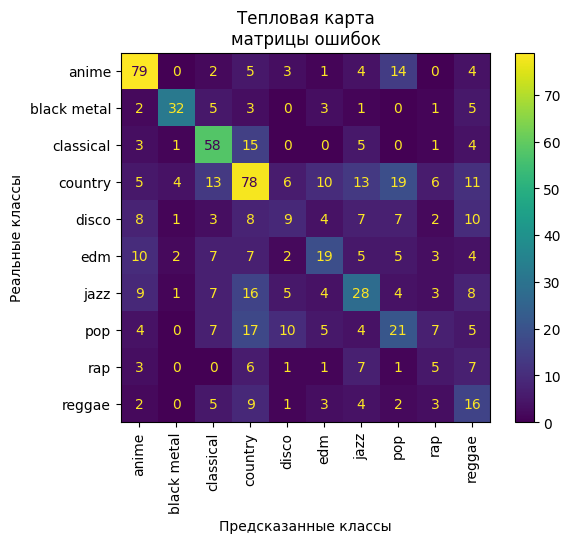

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred),
                              display_labels=genres)

disp.plot()
plt.title('Тепловая карта\nматрицы ошибок')
plt.xticks(rotation='vertical')
plt.xlabel('Предсказанные классы')
plt.ylabel('Реальные классы')
plt.show()

- Самый спорный жанр для алгоритма &mdash; `country`, несмотря на то, что он наиболее часто представлен в обучающей выборке. Алгоритм часто относит изображения жанра `country` к другим жанрам и, наоборот, изображения других жанров помечает жанром `country`.
- Изображения жанра `anime` алгоритм распознаёт достаточно хорошо (79 из 112). Однако 14 изображений были им отнесены к жанру `pop`. А 8, 9, 10 изображений соответственно жанров `disco`, `jazz`, `edm` были отнесены к `anime`.
- 9 изображений жанра `reggae` алгоритм относит к жанру `country`, а для 11 изображений жанра `country` выставляет метку `reggae`. Также алгоритм выставляет метку `reggae` и для 10 изображений жанра `disco`.
- Похожая ситуация и с жанром `edm`.
- Алгоритм практически не распознаёт изображения жанров `rap` и `disco`. Вероятно, по причине низкой представленности этих классов в обучающей выборке, либо в связи с сильной схожестью с изображениями других жанров.
- Несмотря на невысокую представленность в обучающей выборке изображения жанра `black metal` достаточно хорошо определяются алгоритмом. Из 52 изображений 32 были правильно отнесены к жанру. По 5 изображений алгоритм отнёс к жанрам `classical` и `reggae`. Зато всего 9 изображений из 780 алгоритм ошибочно отметил жанром `black metal`.

#### Оценка модели

Интересно проследить зависимость качества предсказания метода ближайшего соседа от количества примеров в обучающей выборке.

Для формирования выборок с разным количеством обучающих примеров зададим функцию.

In [ ]:
def sampling(X, y, sample_size, balanced=False):
    '''
    Функция для получения подвыборки данных
    (сбалансированной и несбалансированной).

    Принимает набор обучающих данных,
    значения целевого признака,
    размер подвыборки,
    указание о сбалансированности данных.
    Возвращает подвыборку набора обучающих данных
    и подвыборку значений целевого признака.
    '''

    y_sampled = pd.DataFrame()

    if balanced:
        for genre_name in genres:
            y_sampled = pd.concat([
                y_sampled,
                y[y['genre'] == genre_name].sample(sample_size,
                                                   random_state=RANDOM_STATE)
            ])
    elif not balanced:
        y_sampled = y.sample(sample_size, random_state=RANDOM_STATE)

    X_sampled = X[y_sampled.index]
    y_sampled.reset_index(drop=True, inplace=True)

    return X_sampled, y_sampled

##### Обучение на сбалансированных данных

Количество наблюдений, формирующих сбалансированную выборку, определяется количеством наблюдений в наименее представленном классе `rap` &mdash; 326 изображений. Следовательно, сбалансированная выборка может быть размером не более 3260.

Сформируем такую сбалансированную выборку.

In [ ]:
X_balanced, y_balanced = sampling(X, y, 326, balanced=True)

y_balanced.index

RangeIndex(start=0, stop=3260, step=1)

Разделим данные на тренировочную и тестовую выборку.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X_balanced, y_balanced, test_size=300,
    random_state=RANDOM_STATE, stratify=y_balanced)

Посмотрим, все ли классы представлены в равной мере в тестовой выборке.

In [ ]:
y_test.value_counts()

genre      
anime          30
black metal    30
classical      30
country        30
disco          30
edm            30
jazz           30
pop            30
rap            30
reggae         30
Name: count, dtype: int64

Выполним переиндексацию целевой переменной последовательными целыми числовыми значениями, начиная с нуля.

In [ ]:
y_test.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

y_train.index

RangeIndex(start=0, stop=2960, step=1)

Обучим алгоритмы поиска ближайшего соседа на различном количестве обучающих данных.

In [ ]:
sample_size = []
accuracy = []

for n in range(1, 296, 3):
    X_train_sampled, y_train_sampled = sampling(X_train, y_train, n, balanced=True)
    y_pred_sampled = predict(X_train_sampled, X_test, y_train_sampled)
    sample_size.append(n * 10)
    accuracy.append(accuracy_score(y_test, y_pred_sampled))

Посмотрим, как изменяется правильность предсказания полученных алгоритмов с увеличением обучающей выборки.

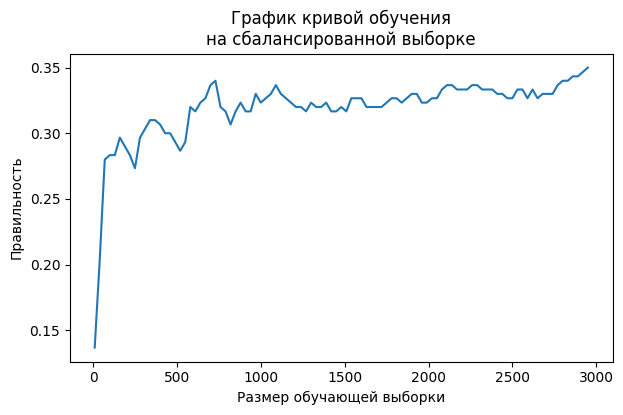

In [ ]:
plt.figure(figsize=(7, 4))
plt.title('График кривой обучения\nна сбалансированной выборке')
plt.plot(sample_size, accuracy)
plt.xlabel('Размер обучающей выборки')
plt.ylabel('Правильность')
plt.show()

- При обучении алгоритмов поиска ближайшего соседа на сбалансированных данных значение правильности не превышает 0,35.
- При размере обучающей выборки в 1000 наблюдений правильность уже достигает значения 0,32. После чего происходит дальнейший постепенный рост значения правильности.
- В конце кривой обучения, при увеличении обучающей выборки с 2500 до 3000, наблюдается рост значения правильности, что даёт основания предполагать дальнейшее улучшение качества предсказания при увеличении выборки сбалансированных данных.

##### Обучение на несбалансированных данных

Теперь разделим все данные на тренировочную и тестовую выборки. В качестве тестовой выборки возьмём 10 % наблюдений (приблизительно такая же доля наблюдений попала в тестовую выборку сбалансированных данных).

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=.1, random_state=RANDOM_STATE)

Посмотрим, как представлены классы в тестовой выборке.

In [ ]:
y_test.value_counts()

genre      
country        164
anime          112
classical       85
jazz            84
pop             79
edm             64
disco           59
black metal     51
reggae          45
rap             31
Name: count, dtype: int64

Выполним переиндексацию целевой переменной последовательными целыми числовыми значениями, начиная с нуля.

In [ ]:
y_test.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

y_train.index

RangeIndex(start=0, stop=6959, step=1)

Обучим алгоритмы поиска ближайшего соседа на различном количестве обучающих данных.

In [ ]:
sample_size = []
accuracy = []

for n in range(1, 6953, 100):
    X_train_sampled, y_train_sampled = sampling(X_train, y_train, n)
    y_pred_sampled = predict(X_train_sampled, X_test, y_train_sampled)
    sample_size.append(n)
    accuracy.append(accuracy_score(y_test, y_pred_sampled))

Посмотрим, как изменяется правильность предсказания полученных алгоритмов с увеличением обучающей выборки.

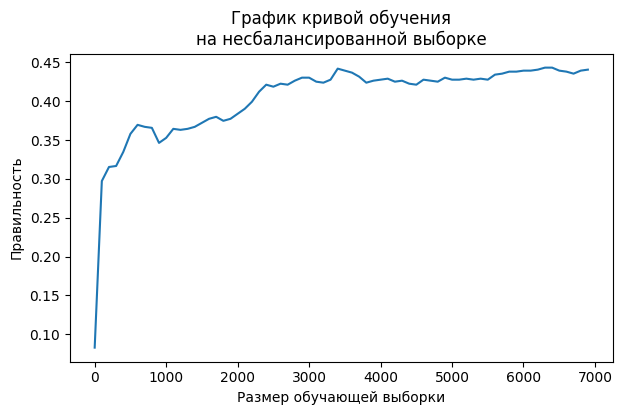

In [ ]:
plt.figure(figsize=(7, 4))
plt.title('График кривой обучения\nна несбалансированной выборке')
plt.plot(sample_size, accuracy)
plt.xlabel('Размер обучающей выборки')
plt.ylabel('Правильность')
plt.show()

- При обучении алгоритмов поиска ближайшего соседа на несбалансированных данных значение правильности не превышает 0,45.
- При размере обучающей выборки в 2500 наблюдений правильность уже достигает значения 0,42. После чего происходит дальнейший постепенный рост значения правильности.
- Поскольку возрастание правильности наблюдается до самого конца кривой обучения, можно полагать, что увеличение размера обучающей выборки будет способствовать ещё большему улучшению качества предсказания методом ближайшего соседа.

**Промежуточный вывод**

- Алгоритм поиска ближайшего соседа обеспечивает быстрый результат предсказания.
- Значение правильности обученного алгоритма достигает 0,44.
- Алгоритм, обученный на 2500 примерах, уже демонстрирует значение правильности равное 0,42. А с ростом числа обучающих примеров значение правильности растёт.
- Дисбаланс классов не оказывает негативного воздействия на метод ближайшего соседа. Алгоритм, обученный на сбалансированной выборке в 2960 примеров, не показывает более высокого качества. Значение правильности не превышает 0,35.
- Следовательно, размер обучающей выборки оказывает решающее влияние, нежели сбалансированность классов.
- Несмотря на достаточно низкое качество предсказания модели лучше всего распознаются изображения жанров `anime`, `black metal` и `classical`.

### Нейронная сеть

Нейронные сети являются эффективными инструментами в решении задач классификации изображений, поскольку способны обучаться на больших объёмах данных и распознавать сложные шаблоны. Использование предобученных на наборе ImageNet нейронных сетей семейства ResNet позволит ускорить процесс обучения, снизить потребность в вычислительных ресурсах и улучшить качество классификации. Их нужно только дообучить на доступных данных, а не обучать сложные модели с нуля, что особенно важно для текущей задачи, поскольку в нашем распоряжении находится небольшой объём данных для обучения.

Таким образом, задача обучения модели для решения задачи классификации будет сводиться к донастраиванию (подбору гиперпараметров) предобученных моделей нейросетей. Выбор архитектуры предобученной нейронной сети будем проводить среди ResNet18, ResNet34, ResNet50, ResNet101, ResNet152.

В качестве основного инструмента в построении моделей нейронных сетей используем библиотеку *fastai*, в которой в виде метода `fit_one_cycle` реализован способ быстрого обучения моделей, причём каждый цикл обучения (эпоха) выполняется с изменяющейся скоростью. В начале каждой эпохи обучение начинается медленно, с низкой скоростью, затем скорость обучения увеличивается, и заканчивается обучение тоже медленно, скорость обучения опять уменьшается.

Функция `vision_learner` помогает собрать модель на основе предобученной нейронной сети, загрузчика данных `ImageDataLoaders` и функции потерь. Для ускорения обучения и сокращения используемой памяти можно использовать функцию `to_fp16`, которая преобразует веса модели в 16-битный формат данных с плавающей запятой.

#### Извлечение данных

В библиотеке *fastai* нет инструментов для работы с zip-архивами, поэтому все папки с изображениями необходимо предварительно извлечь в текущую папку, к которой ведёт путь `path`.

In [ ]:
for genre_name in genres:
    with ZipFile(f'{path}{genre_name}.zip') as archive:
        archive.extractall(path)

Посмотрим, сколько всего изображений извлечено из архивов.

In [ ]:
len(get_image_files(path))

7800

Для удобного доступа к файлу с изображением с помощью загрузчика `ImageDataLoaders` сформируем в наборе данных колонку с путём к файлу в формате `<папка-жанр>/<название файла>.png`.

In [ ]:
data['path'] = data['genre'] + '/' + data['filename']
data.head()

,filename,genre,size,format,height,width,mode,size_genre,path
0,00095702-6b86-4bb1-880e-1e09e759a013.png,anime,228202,PNG,300,300,RGBA,228202_anime,anime/00095702-6b86-4bb1-880e-1e09e759a013.png
1,0091bee3-a67a-457e-8c5f-b4a1055b1211.png,anime,96792,PNG,300,300,RGBA,96792_anime,anime/0091bee3-a67a-457e-8c5f-b4a1055b1211.png
2,00a9d688-337f-4807-83cd-596540f1683b.png,anime,168296,PNG,300,300,RGBA,168296_anime,anime/00a9d688-337f-4807-83cd-596540f1683b.png
3,00ddb3de-75db-4e27-ad3d-441a5dc95636.png,anime,210657,PNG,300,300,RGBA,210657_anime,anime/00ddb3de-75db-4e27-ad3d-441a5dc95636.png
4,00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png,anime,171638,PNG,300,300,RGBA,171638_anime,anime/00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png


Проверим, все ли изображения были извлечены из архивов без ошибок. Здесь же воспользуемся сформированной колонкой с путём к файлу с изображением.

In [ ]:
for row in data.index:
    try:
        img = Image.open(path + data.loc[row, 'path'])
        img.verify()
    except IOError as e:
        print("Ошибка при открытии файла: ", e)

#### Разделение данных на выборки

Выделим в данных тестовую выборку.

In [ ]:
data_other, data_test = train_test_split(
    data, test_size=780, random_state=RANDOM_STATE)

Посмотрим, что получилось.

In [ ]:
data_test.shape

(780, 9)

In [ ]:
data_other.shape

(6953, 9)

#### Валидация

Размер валидационной выборки установим равным размеру тестовой выборки &mdash; 10 % от исходного набора данных или 780 изображений.

В качестве метрик многоклассовой классификации будем также рассчитывать правильность, точность, полноту и F1-меру и отслеживать изменение их значений при переходе от одной эпохи к другой. Однако вследствие того, что их значения по своей величине практически повторяют друг друга, основной метрикой для отслеживания выберем правильность.

При решении задачи многоклассовой классификации расчёт метрик точности, полноты и F1-меры будем производить способом усреднения соответствующих метрик, вычисленных для каждого класса. Для этого используем параметр `average`. Для учёта дисбаланса классов параметру `average` передадим значение `weighted`, при котором метрика для каждого класса получится взвешенной, т. е. будет рассчитана в зависимости от количества примеров в обучающей выборке.

In [ ]:
VALID_SIZE = 780/6953
METRIC_LIST = [accuracy,
               Precision(average='weighted'),
               Recall(average='weighted'),
               F1Score(average='weighted')]

Визуализировать ход обучения моделей будем с помощью кривых обучения. В качестве независимой переменной используем шаги обучения, на которых происходит загрузка порций (батчей) изображений в нейросеть.

In [ ]:
def plotting_loss(optional=''):
    '''
    Функция для построения кривой обучения -
    зависимости значений функции потерь от
    шага обучения.

    Принимает (опционально) параметры текущей
    нейросети для указания их в названии графика.
    Возвращает график кривой обучения.
    '''

    learn.recorder.plot_loss()
    plt.title('График зависимости\n' +
              'значений функции потерь от шага обучения' +
              optional)
    plt.xlabel('Шаг обучения')
    plt.ylabel('Значение функции потерь')
    plt.legend(['Тренировочная выборка',
                'Валидационная выборка'])
    plt.show()

#### Загрузчик данных

Для передачи модели нейросети изображений необходимо сформировать загрузчик `ImageDataLoaders`, который будет передавать модели изображения порциями (батчами), предварительно векторизуя их и применяя к ним аугментацию. Для воспроизводимости условий обучения зафиксируем исходное состояние (`seed`).

In [ ]:
def image_loader(df=data_other[['path', 'genre']],
                 path=path,
                 valid_pct=VALID_SIZE,
                 seed=RANDOM_SEED,
                 bs=64,
                 item_tfms=None,
                 batch_tfms=None):
    '''
    Функция загрузки и предварительной обработки изображений
    с помощью загрузчика ImageDataLoaders.

    Принимает набор данных с колонками, содержащими
    путь к файлу с изображением и название музыкального
    жанра, к которому относится диск,
    путь к папке с папками-жанрами,
    размер валидационной выборки (как часть от всей выборки),
    размер батча,
    список трансформаций, применяемым к отодельным изображениям,
    список трансформаций, применяемым к батчу с изображениями.
    Возвращает загрузчик изображений.
    '''

    return ImageDataLoaders.from_df(df=df,
                                    path=path,
                                    valid_pct=valid_pct,
                                    seed=seed,
                                    bs=bs,
                                    item_tfms=item_tfms,
                                    batch_tfms=batch_tfms)

Посмотрим, какие изображения попадают в загрузчик.

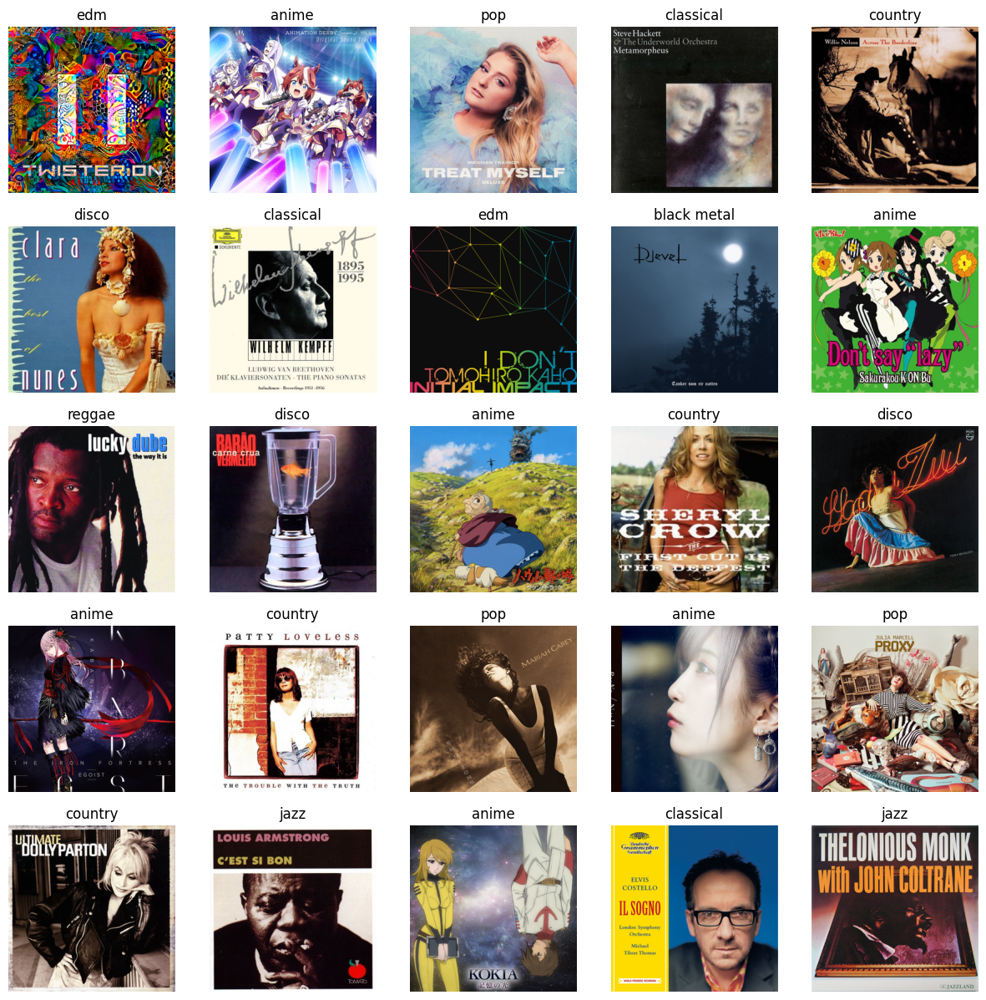

In [ ]:
dls = image_loader()
dls.show_batch(max_n=25)

#### Подбор скорости обучения

Для выбора скорости обучения нейронной сети можно использовать валидационные кривые зависимости значений функции потерь от скорости обучения. Функция, строящая такие кривые, предоставляется библиотекой *fastai*.

На графике валидационной кривой отмечается область долины (`valley`) &mdash; область, где потери стабильно низкие и изменяются не очень резко. Рекомендуется подбирать скорость обучения модели, которая больше скорости обучения в области долины (т. е. на графике кривой соответствующие точки лежат правее области долины), но ещё не достигли точки минимума функции потерь.

In [ ]:
def find_lr():
    '''
    Функция для построения валидационной кривой
    зависимости значений функции потерь от
    скорости обучения нейросети.

    Возвращает график валидационной кривой
    с отмеченной на ней областью долины.
    '''

    learn.lr_find(start_lr=1e-05)
    plt.title('График зависимости\n' +
              'значений функции потерь от скорости обучения')
    plt.xlabel('Скорость обучения')
    plt.ylabel('Значение функции потерь')
    plt.legend(['Валидационная кривая', 'Область долины'])
    plt.show()

Построим валидационные кривые для диапазона скоростей 10$^{-5}$&ndash;10$^{0}$ для выбранных архитектур предобученных нейронных сетей.

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 122MB/s] 


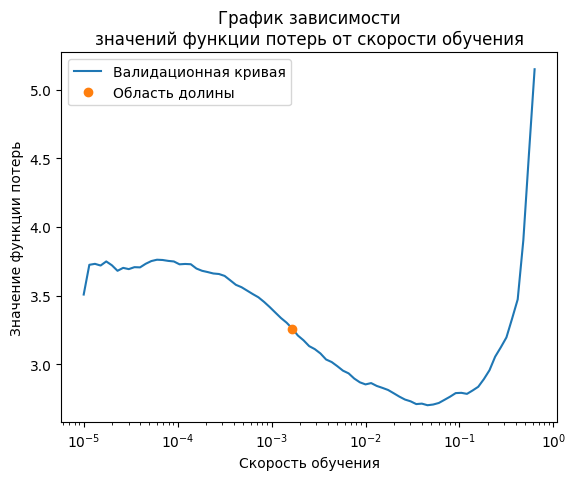

In [ ]:
dls = image_loader()
learn = vision_learner(
    dls, resnet18, metrics=accuracy, model_dir='/tmp/model/').to_fp16()
find_lr()

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 128MB/s] 


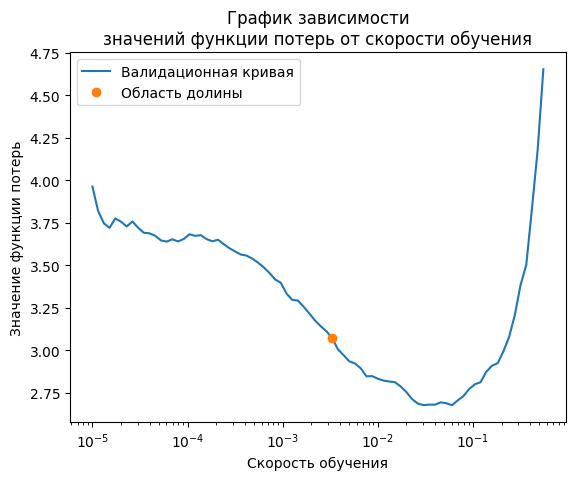

In [ ]:
dls = image_loader()
learn = vision_learner(
    dls, resnet34, metrics=accuracy, model_dir='/tmp/model/').to_fp16()
find_lr()

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 127MB/s] 


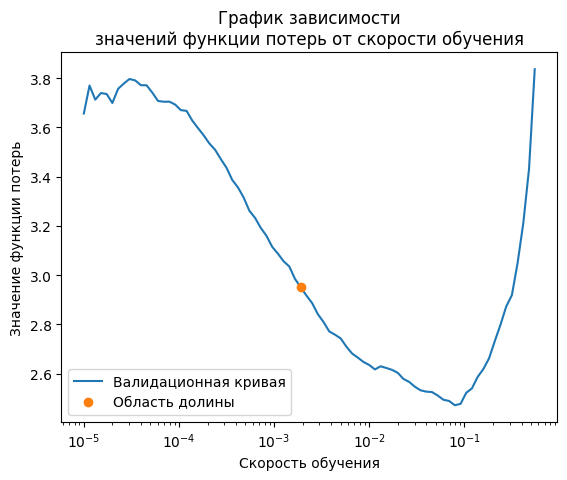

In [ ]:
dls = image_loader()
learn = vision_learner(
    dls, resnet50, metrics=accuracy, model_dir='/tmp/model/').to_fp16()
find_lr()

Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /root/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth
100%|██████████| 171M/171M [00:01<00:00, 110MB/s]  


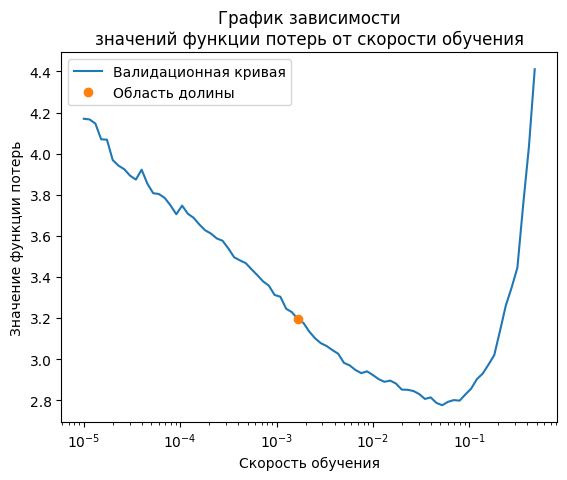

In [ ]:
dls = image_loader(bs=32)
learn = vision_learner(
    dls, resnet101, metrics=accuracy, model_dir='/tmp/model/').to_fp16()
find_lr()

Downloading: "https://download.pytorch.org/models/resnet152-f82ba261.pth" to /root/.cache/torch/hub/checkpoints/resnet152-f82ba261.pth
100%|██████████| 230M/230M [00:01<00:00, 149MB/s]  


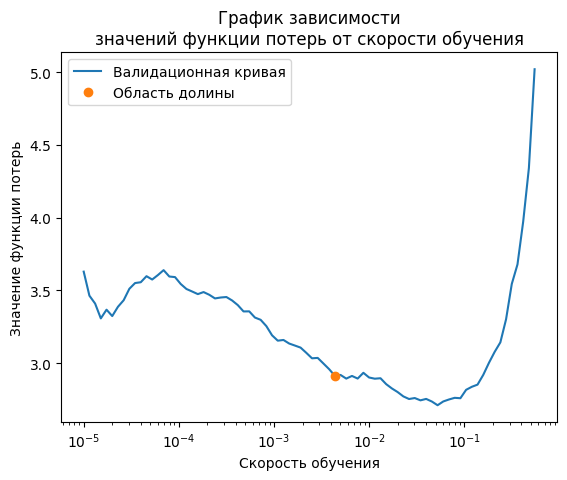

In [ ]:
dls = image_loader(bs=32)
learn = vision_learner(
    dls, resnet152, metrics=accuracy, model_dir='/tmp/model/').to_fp16()
find_lr()

- Область долины на всех графиках расположена в области значения скорости обучения, равного 2$\cdot$10$^{-3}$. Значение функции потерь в области долины находится в диапазоне 2,9&ndash;3,2.
- Минимум функции потерь на валидационных кривых на всех графиках лежит в области 5$\cdot$10$^{-2}$&ndash;1$\cdot$10$^{-1}$. Минимум значений функции потерь находится в диапазоне 2,5&ndash;2,8.

#### Выбор архитектуры предобученной нейронной сети

Для того чтобы выбрать архитектуру предобученной нейронной сети проведём обучение алгоритмов при трёх уровнях скоростей обучения: 2$\cdot$10$^{-3}$ &mdash; значения, лежащего в области долины, 5$\cdot$10$^{-4}$ &mdash; значения, лежащего на графике валидационной кривой левее области долины, и 1$\cdot$10$^{-2}$ &mdash; значения, лежащего правее области долины.

Количество эпох обучения выберем равным 10. Остальные параметры &mdash; по умолчанию.

##### ResNet18


(ResNet18, lr = 0.0005)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,3.193872,1.894126,0.364103,0.355224,0.364103,0.356768,00:30
1,2.227467,1.499890,0.555128,0.550732,0.555128,0.541729,00:28
2,1.726616,1.366568,0.571795,0.565897,0.571795,0.560650,00:28
3,1.409820,1.321118,0.615385,0.611394,0.615385,0.604560,00:28
4,1.184694,1.269159,0.615385,0.616365,0.615385,0.611713,00:27
5,1.082936,1.251003,0.610256,0.605631,0.610256,0.602424,00:28
6,0.981145,1.250137,0.608974,0.608512,0.608974,0.603553,00:27
7,0.919706,1.239905,0.614103,0.615076,0.614103,0.609524,00:27
8,0.888145,1.234371,0.611538,0.608397,0.611538,0.606531,00:27
9,0.837106,1.233132,0.616667,0.614936,0.616667,0.612671,00:27


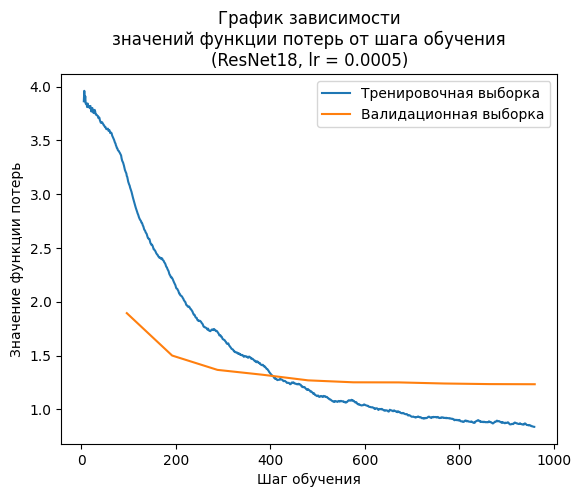


(ResNet18, lr = 0.002)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.539701,1.620181,0.502564,0.468850,0.502564,0.479253,00:28
1,1.737300,1.344783,0.600000,0.588886,0.600000,0.590960,00:27
2,1.352859,1.358068,0.585897,0.603600,0.585897,0.584870,00:27
3,1.088633,1.255918,0.628205,0.628875,0.628205,0.621921,00:27
4,0.920417,1.187063,0.629487,0.638000,0.629487,0.628168,00:27
5,0.787404,1.193275,0.619231,0.629522,0.619231,0.614813,00:27
6,0.664674,1.196626,0.637179,0.645793,0.637179,0.632672,00:28
7,0.569925,1.189909,0.630769,0.635674,0.630769,0.628771,00:27
8,0.489858,1.199704,0.630769,0.635770,0.630769,0.628381,00:27
9,0.450041,1.191735,0.629487,0.634118,0.629487,0.626903,00:27


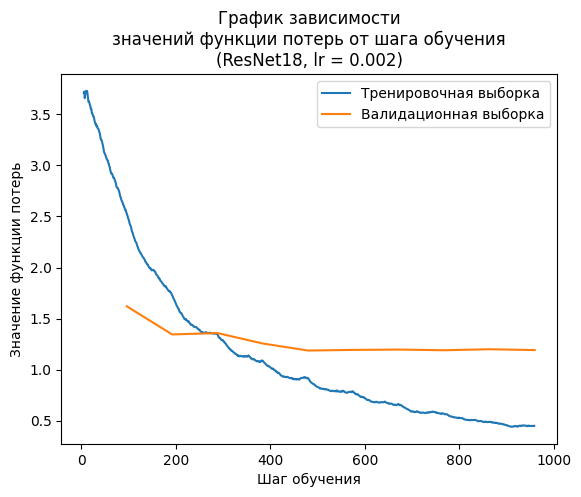


(ResNet18, lr = 0.01)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.050702,1.546850,0.539744,0.554079,0.539744,0.538944,00:27
1,1.599683,1.682206,0.493590,0.493448,0.493590,0.475274,00:28
2,1.445659,1.393260,0.547436,0.588998,0.547436,0.542761,00:28
3,1.243326,1.419284,0.541026,0.610884,0.541026,0.544136,00:28
4,1.112013,1.325442,0.560256,0.627430,0.560256,0.563048,00:27
5,0.957311,1.209663,0.615385,0.626512,0.615385,0.613566,00:27
6,0.811607,1.194799,0.633333,0.634040,0.633333,0.627801,00:27
7,0.669166,1.161618,0.638462,0.663106,0.638462,0.640938,00:27
8,0.516378,1.154815,0.657692,0.665088,0.657692,0.655431,00:27
9,0.448484,1.150496,0.653846,0.658477,0.653846,0.649802,00:27


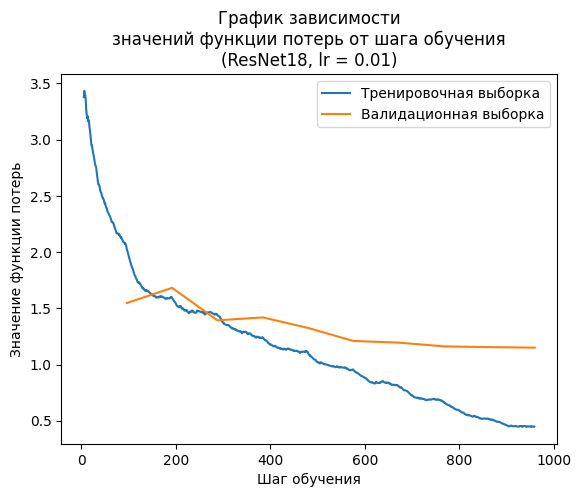

In [ ]:
dls = image_loader()

for lr_value in [5e-4, 2e-3, 1e-2]:
    print(f'\n(ResNet18, lr = {lr_value})')
    learn = vision_learner(
        dls, resnet18, lr=lr_value, metrics=METRIC_LIST).to_fp16()
    learn.fit_one_cycle(10)
    plotting_loss(f'\n(ResNet18, lr = {lr_value})')

В ходе обучения модели на основе предобученной нейросети ResNet18
- при скорости обучения 5$\cdot$10$^{-4}$ 
    - значение правильности увеличилось до 0,612&ndash;0,617,
    - значение функции потерь на валидационной выборке монотонно снижалось с 1,89 до 1,23,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 3,19 до 0,84;
- при скорости обучения 2$\cdot$10$^{-3}$ 
    - значение правильности увеличилось до 0,629&ndash;0,631,
    - значение функции потерь на валидационной выборке снизилось с 1,62 до 1,19,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,54 до 0,45;
- при скорости обучения 1$\cdot$10$^{-2}$ 
    - значение правильности увеличилось до 0,638&ndash;0,658,
    - значение функции потерь на валидационной выборке снизилось с 1,55 до 1,15,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,05 до 0,45.
    
Время обучения одной эпохи составляет 27 с, время обучения одной модели &mdash; около 270 с.

Наилучшее качество предсказания получается при скорости обучения 1$\cdot$10$^{-2}$.

##### ResNet34


(ResNet34, lr = 0.0005)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,3.088974,1.904931,0.387179,0.362460,0.387179,0.363483,00:30
1,2.175311,1.399362,0.546154,0.531652,0.546154,0.530797,00:30
2,1.670165,1.281289,0.593590,0.583101,0.593590,0.582324,00:30
3,1.335997,1.237682,0.597436,0.587941,0.597436,0.588229,00:30
4,1.141474,1.208690,0.616667,0.615355,0.616667,0.612249,00:30
5,1.012462,1.185180,0.621795,0.617204,0.621795,0.616200,00:30
6,0.920658,1.176872,0.615385,0.606626,0.615385,0.606855,00:30
7,0.828043,1.171610,0.620513,0.613061,0.620513,0.613759,00:30
8,0.767746,1.174307,0.625641,0.620194,0.625641,0.619943,00:30
9,0.763725,1.169755,0.628205,0.624048,0.628205,0.623397,00:30


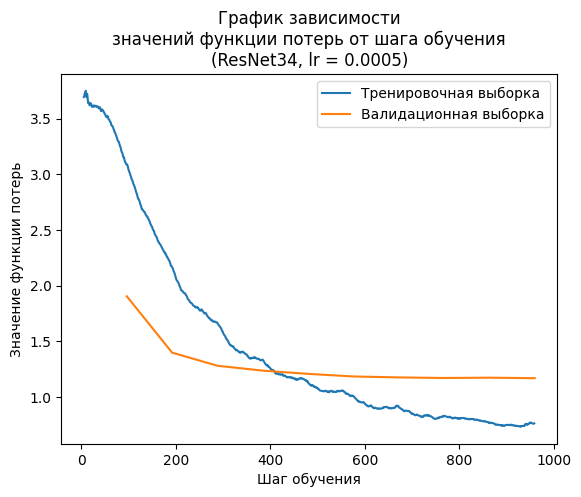


(ResNet34, lr = 0.002)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.480795,1.509070,0.525641,0.505398,0.525641,0.505724,00:30
1,1.698649,1.347363,0.588462,0.586291,0.588462,0.582147,00:30
2,1.288170,1.206477,0.616667,0.614846,0.616667,0.608334,00:30
3,0.998050,1.261916,0.616667,0.619099,0.616667,0.605635,00:30
4,0.833355,1.191914,0.634615,0.641772,0.634615,0.630677,00:30
5,0.694476,1.215559,0.651282,0.655100,0.651282,0.645580,00:30
6,0.564517,1.197124,0.650000,0.652454,0.650000,0.645610,00:30
7,0.459700,1.213510,0.643590,0.654392,0.643590,0.642609,00:30
8,0.378340,1.215244,0.653846,0.658468,0.653846,0.651777,00:30
9,0.352835,1.214302,0.650000,0.655912,0.650000,0.648280,00:30


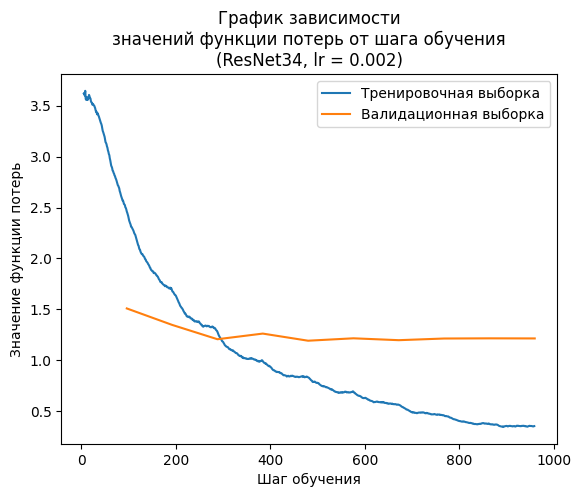


(ResNet34, lr = 0.01)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.891339,1.542519,0.552564,0.557037,0.552564,0.544510,00:30
1,1.525025,1.536226,0.530769,0.550996,0.530769,0.510204,00:30
2,1.382155,1.467808,0.555128,0.611012,0.555128,0.548961,00:30
3,1.192119,1.327211,0.570513,0.633797,0.570513,0.558827,00:30
4,1.028036,1.259557,0.602564,0.617552,0.602564,0.605172,00:30
5,0.911279,1.354311,0.570513,0.630944,0.570513,0.570669,00:30
6,0.749729,1.190085,0.626923,0.623578,0.626923,0.621608,00:30
7,0.574241,1.153836,0.646154,0.661532,0.646154,0.650102,00:30
8,0.439995,1.190245,0.646154,0.661290,0.646154,0.649210,00:30
9,0.349995,1.188147,0.652564,0.663400,0.652564,0.653660,00:30


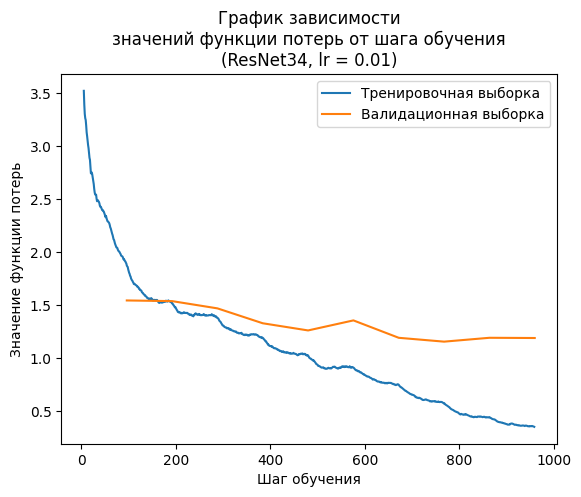

In [ ]:
dls = image_loader()

for lr_value in [5e-4, 2e-3, 1e-2]:
    print(f'\n(ResNet34, lr = {lr_value})')
    learn = vision_learner(
        dls, resnet34, lr=lr_value, metrics=METRIC_LIST).to_fp16()
    learn.fit_one_cycle(10)
    plotting_loss(f'\n(ResNet34, lr = {lr_value})')

В ходе обучения модели на основе предобученной нейросети ResNet34
- при скорости обучения 5$\cdot$10$^{-4}$ 
    - значение правильности увеличилось до 0,621&ndash;0,628,
    - значение функции потерь на валидационной выборке монотонно снижалось с 1,90 до 1,17,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 3,09 до 0,76;
- при скорости обучения 2$\cdot$10$^{-3}$ 
    - значение правильности увеличилось до 0,644&ndash;0,654,
    - значение функции потерь на валидационной выборке снизилось с 1,51 до 1,21,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,48 до 0,35;
- при скорости обучения 1$\cdot$10$^{-2}$ 
    - значение правильности увеличилось до 0,646&ndash;0,653,
    - значение функции потерь на валидационной выборке снизилось с 1,54 до 1,19,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 1,89 до 0,35.
    
Время обучения одной эпохи составляет 30 с, время обучения одной модели &mdash; около 300 с.

Наилучшее качество предсказания получается при скорости обучения 1$\cdot$10$^{-2}$.

##### ResNet50


(ResNet50, lr = 0.0005)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.616423,1.571340,0.516667,0.504569,0.516667,0.492213,00:47
1,1.822259,1.262968,0.606410,0.602653,0.606410,0.599725,00:47
2,1.288197,1.127172,0.630769,0.625845,0.630769,0.621416,00:47
3,0.921134,1.141782,0.647436,0.647445,0.647436,0.644380,00:47
4,0.710417,1.137260,0.646154,0.640489,0.646154,0.638720,00:47
5,0.556206,1.095595,0.661538,0.656866,0.661538,0.655534,00:47
6,0.450096,1.094410,0.670513,0.666874,0.670513,0.666177,00:47
7,0.362664,1.093662,0.675641,0.669399,0.675641,0.669446,00:47
8,0.315894,1.082609,0.679487,0.676327,0.679487,0.674975,00:47
9,0.302286,1.085160,0.678205,0.672674,0.678205,0.672276,00:47


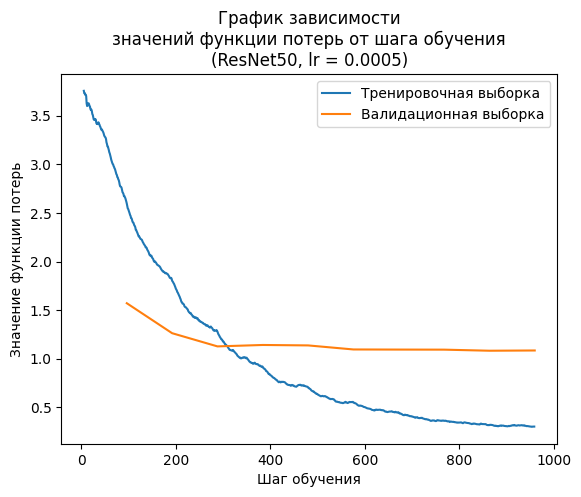


(ResNet50, lr = 0.002)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.106677,1.335717,0.614103,0.613988,0.614103,0.606083,00:47
1,1.442612,1.214529,0.634615,0.633099,0.634615,0.628326,00:47
2,1.013139,1.131726,0.642308,0.637526,0.642308,0.636494,00:47
3,0.734662,1.128479,0.643590,0.644000,0.643590,0.642728,00:47
4,0.539715,1.113152,0.652564,0.654225,0.652564,0.650759,00:47
5,0.395817,1.151258,0.674359,0.683780,0.674359,0.675550,00:47
6,0.288355,1.119512,0.685897,0.688032,0.685897,0.682738,00:47
7,0.198060,1.129239,0.669231,0.672910,0.669231,0.666490,00:47
8,0.151546,1.118515,0.689744,0.692147,0.689744,0.687857,00:47
9,0.127168,1.105185,0.688462,0.688417,0.688462,0.685071,00:47


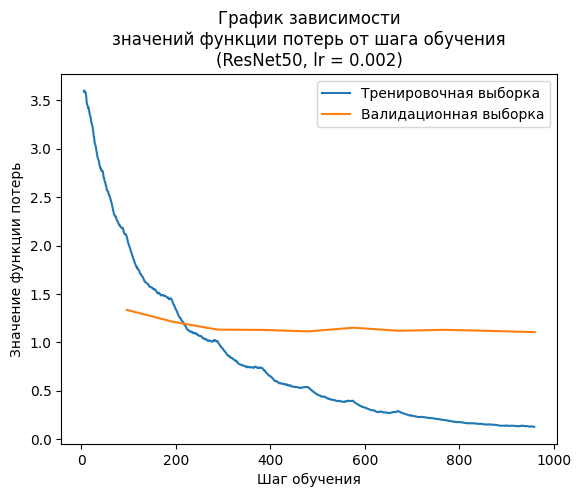


(ResNet50, lr = 0.01)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.777552,1.261535,0.608974,0.605822,0.608974,0.601849,00:47
1,1.251518,1.227551,0.616667,0.611804,0.616667,0.609510,00:47
2,1.127419,1.083235,0.656410,0.668184,0.656410,0.658444,00:47
3,0.880470,1.164238,0.639744,0.666167,0.639744,0.644090,00:47
4,0.604884,1.149759,0.657692,0.672301,0.657692,0.654176,00:47
5,0.454182,1.193579,0.661538,0.671399,0.661538,0.662258,00:47
6,0.301267,1.192267,0.671795,0.686175,0.671795,0.675370,00:47
7,0.176158,1.219279,0.687180,0.695163,0.687179,0.689358,00:47
8,0.117606,1.241162,0.692308,0.701083,0.692308,0.694327,00:47
9,0.090588,1.261540,0.689744,0.696399,0.689744,0.691539,00:47


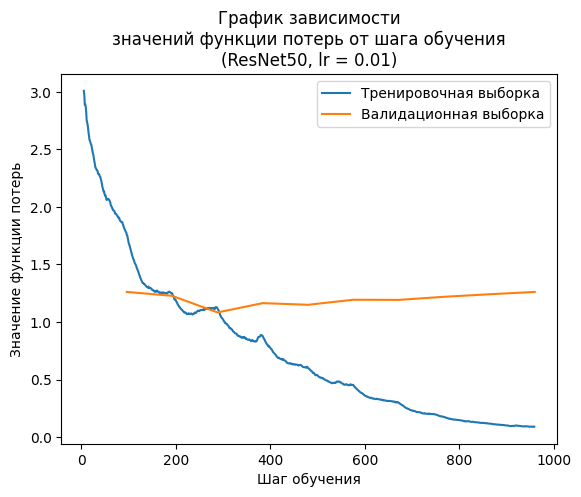

In [ ]:
dls = image_loader()

for lr_value in [5e-4, 2e-3, 1e-2]:
    print(f'\n(ResNet50, lr = {lr_value})')
    learn = vision_learner(
        dls, resnet50, lr=lr_value, metrics=METRIC_LIST).to_fp16()
    learn.fit_one_cycle(10)
    plotting_loss(f'\n(ResNet50, lr = {lr_value})')

В ходе обучения модели на основе предобученной нейросети ResNet50
- при скорости обучения 5$\cdot$10$^{-4}$ 
    - значение правильности увеличилось до 0,675&ndash;0,679,
    - значение функции потерь на валидационной выборке почти монотонно снижалось с 1,57 до 1,08,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,61 до 0,30;
- при скорости обучения 2$\cdot$10$^{-3}$ 
    - значение правильности увеличилось до 0,686&ndash;0,690,
    - значение функции потерь на валидационной выборке почти монотонно снижалось с 1,34 до 1,11,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,12 до 0,13;
- при скорости обучения 1$\cdot$10$^{-2}$ 
    - значение правильности увеличилось до 0,687&ndash;0,692,
    - значение функции потерь на валидационной выборке снизилось с 1,26 до 1,08 за три эпохи, а затем за оставшиеся 7 эпох вернулось на тот же уровень 1,26,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 1,78 до 0,09.
    
Время обучения одной эпохи составляет 47 с, время обучения одной модели &mdash; около 470 с.

Наилучшее качество предсказания получается при скорости обучения 1$\cdot$10$^{-2}$.

##### ResNet101


(ResNet101, lr = 0.0005)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.328996,1.470285,0.551282,0.541665,0.551282,0.533627,01:12
1,1.641448,1.303945,0.593590,0.589626,0.593590,0.583582,01:12
2,1.301445,1.157958,0.639744,0.636027,0.639744,0.635238,01:12
3,0.968335,1.137165,0.642308,0.646763,0.642308,0.639585,01:11
4,0.827621,1.056822,0.657692,0.663866,0.657692,0.657774,01:11
5,0.629995,1.079101,0.651282,0.655483,0.651282,0.650203,01:11
6,0.527217,1.075454,0.658974,0.657882,0.658974,0.655179,01:11
7,0.417915,1.070734,0.670513,0.677152,0.670513,0.671045,01:11
8,0.364256,1.073870,0.665385,0.667067,0.665385,0.662506,01:11
9,0.373424,1.072829,0.656410,0.658928,0.656410,0.653539,01:11


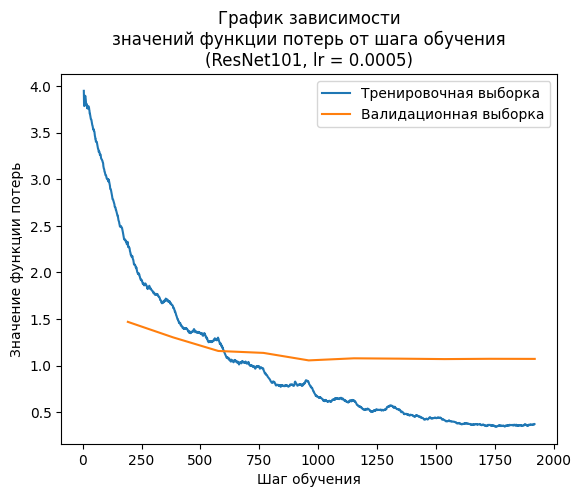


(ResNet101, lr = 0.002)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.972929,1.340459,0.592308,0.586882,0.592308,0.583592,01:11
1,1.448238,1.243766,0.597436,0.603826,0.597436,0.594573,01:11
2,1.059533,1.096205,0.641026,0.638970,0.641026,0.635569,01:11
3,0.890134,1.076129,0.667949,0.677756,0.667949,0.668963,01:11
4,0.668685,1.060543,0.666667,0.676217,0.666667,0.666468,01:11
5,0.487169,1.119131,0.671795,0.683504,0.671795,0.672094,01:11
6,0.331531,1.121937,0.684615,0.699464,0.684615,0.687092,01:11
7,0.250325,1.141015,0.687180,0.696175,0.687179,0.688728,01:11
8,0.189682,1.157915,0.678205,0.689885,0.678205,0.680349,01:11
9,0.166561,1.149847,0.687180,0.692168,0.687179,0.685911,01:11


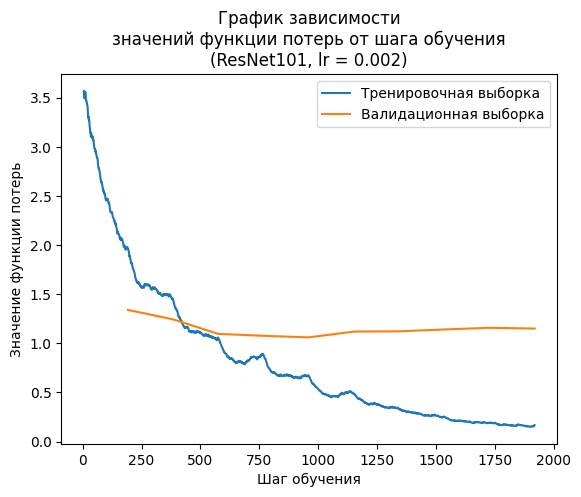


(ResNet101, lr = 0.01)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.715787,1.307690,0.597436,0.594269,0.597436,0.593337,01:11
1,1.381279,1.287205,0.620513,0.610890,0.620513,0.606324,01:11
2,1.218374,1.194249,0.646154,0.658317,0.646154,0.639312,01:11
3,0.960822,1.009561,0.671795,0.692059,0.671795,0.673455,01:11
4,0.799185,0.984392,0.679487,0.689772,0.679487,0.681197,01:11
5,0.606278,0.988184,0.693590,0.710572,0.693590,0.693592,01:11
6,0.377166,1.031538,0.710256,0.715105,0.710256,0.710804,01:11
7,0.222930,1.057765,0.705128,0.723049,0.705128,0.707222,01:11
8,0.145009,1.059946,0.711538,0.721875,0.711538,0.713476,01:11
9,0.108380,1.074343,0.708974,0.719821,0.708974,0.709990,01:11


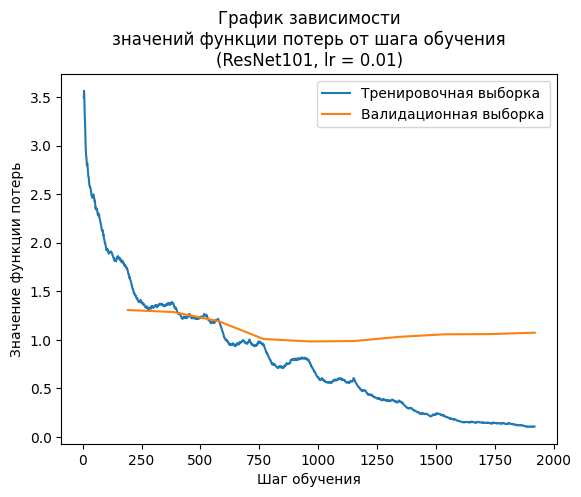

In [ ]:
dls = image_loader(bs=32)

for lr_value in [5e-4, 2e-3, 1e-2]:
    print(f'\n(ResNet101, lr = {lr_value})')
    learn = vision_learner(
        dls, resnet101, lr=lr_value, metrics=METRIC_LIST).to_fp16()
    learn.fit_one_cycle(10)
    plotting_loss(f'\n(ResNet101, lr = {lr_value})')

В ходе обучения модели на основе предобученной нейросети ResNet101
- при скорости обучения 5$\cdot$10$^{-4}$ 
    - значение правильности увеличилось до 0,656&ndash;0,671,
    - значение функции потерь на валидационной выборке снизилось с 1,47 до 1,07,
    - значение функции потерь на тренировочной выборке почти монотонно снижалось с 2,33 до 0,37;
- при скорости обучения 2$\cdot$10$^{-3}$ 
    - значение правильности увеличилось до 0,678&ndash;0,687,
    - значение функции потерь на валидационной выборке снизилось с 1,34 до 1,06 за пять эпох, а затем за другие пять эпох поднялось до 1,15,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 1,97 до 0,17;
- при скорости обучения 1$\cdot$10$^{-2}$ 
    - значение правильности увеличилось до 0,705&ndash;0,712,
    - значение функции потерь на валидационной выборке снизилось с 1,31 до 0,98 за первые пять эпох, а затем за другие пять эпох поднялось до 1,07,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 1,38 до 0,11.
    
Время обучения одной эпохи составляет 71 с, время обучения одной модели &mdash; около 710 с.

Наилучшее качество предсказания получается при скорости обучения 1$\cdot$10$^{-2}$.

##### ResNet152


(ResNet152, lr = 0.0005)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.392613,1.491935,0.557692,0.552987,0.557692,0.548919,01:40
1,1.627594,1.241044,0.614103,0.611818,0.614103,0.608955,01:40
2,1.250100,1.196278,0.638462,0.634308,0.638462,0.631808,01:40
3,0.965369,1.148191,0.656410,0.653609,0.656410,0.651752,01:39
4,0.747824,1.073360,0.678205,0.673254,0.678205,0.672573,01:39
5,0.569749,1.060760,0.676923,0.684999,0.676923,0.675478,01:39
6,0.472811,1.079622,0.674359,0.674984,0.674359,0.669719,01:39
7,0.413156,1.077660,0.679487,0.681360,0.679487,0.676383,01:39
8,0.330972,1.066825,0.667949,0.670561,0.667949,0.663718,01:39
9,0.328002,1.075223,0.675641,0.678282,0.675641,0.671334,01:39


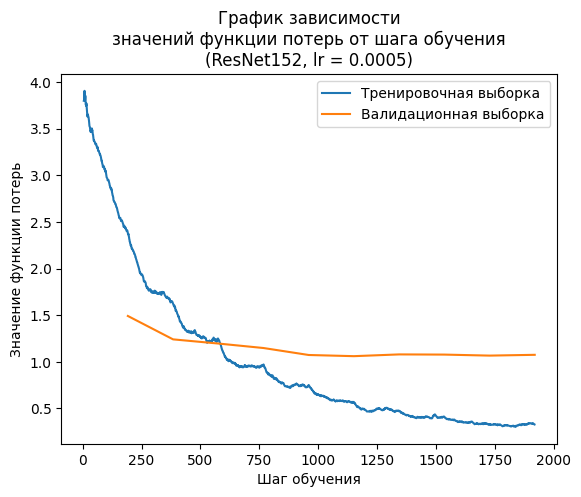


(ResNet152, lr = 0.002)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.958624,1.355780,0.608974,0.608705,0.608974,0.604991,01:39
1,1.400432,1.260868,0.614103,0.614746,0.614103,0.607060,01:39
2,1.070198,1.109416,0.651282,0.654032,0.651282,0.650098,01:39
3,0.849884,1.123538,0.647436,0.650501,0.647436,0.643995,01:39
4,0.616578,1.070006,0.679487,0.687046,0.679487,0.680742,01:39
5,0.464265,1.102321,0.678205,0.680742,0.678205,0.677087,01:39
6,0.296803,1.134037,0.691026,0.689455,0.691026,0.686191,01:39
7,0.213794,1.143775,0.684615,0.690300,0.684615,0.682677,01:39
8,0.182824,1.159211,0.702564,0.704733,0.702564,0.697705,01:39
9,0.154315,1.139947,0.687180,0.690379,0.687179,0.685174,01:39


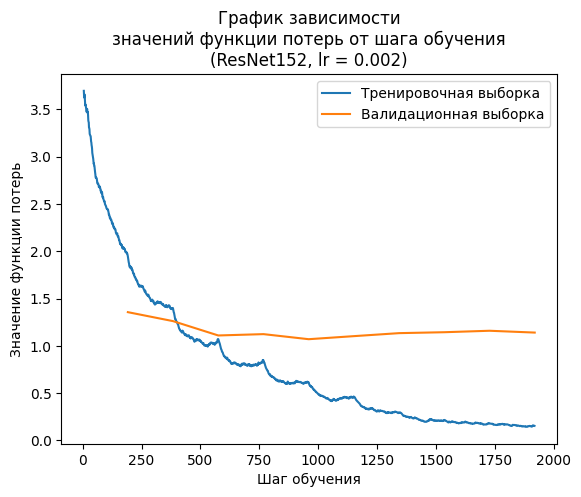


(ResNet152, lr = 0.01)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.693320,1.283955,0.596154,0.592510,0.596154,0.593551,01:39
1,1.383742,1.283296,0.608974,0.623182,0.608974,0.606528,01:39
2,1.150761,1.115811,0.647436,0.665005,0.647436,0.643790,01:39
3,0.942138,1.071071,0.652564,0.682106,0.652564,0.652760,01:39
4,0.744708,1.040447,0.660256,0.662901,0.660256,0.656984,01:39
5,0.614325,1.117803,0.670513,0.694916,0.670513,0.672876,01:39
6,0.376040,1.145180,0.679487,0.692051,0.679487,0.683587,01:39
7,0.226163,1.209742,0.697436,0.704578,0.697436,0.698502,01:39
8,0.122615,1.215850,0.692308,0.703300,0.692308,0.694186,01:39
9,0.100108,1.222004,0.701282,0.715238,0.701282,0.704679,01:39


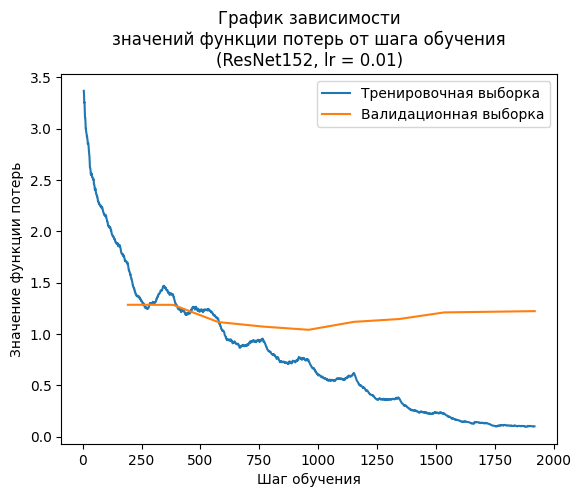

In [ ]:
dls = image_loader(bs=32)

for lr_value in [5e-4, 2e-3, 1e-2]:
    print(f'\n(ResNet152, lr = {lr_value})')
    learn = vision_learner(
        dls, resnet152, lr=lr_value, metrics=METRIC_LIST).to_fp16()
    learn.fit_one_cycle(10)
    plotting_loss(f'\n(ResNet152, lr = {lr_value})')

В ходе обучения модели на основе предобученной нейросети ResNet152
- при скорости обучения 5$\cdot$10$^{-4}$ 
    - значение правильности увеличилось до 0,668&ndash;0,679,
    - значение функции потерь на валидационной выборке снизилось с 1,49 до 1,08,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,39 до 0,33;
- при скорости обучения 2$\cdot$10$^{-3}$ 
    - значение правильности увеличилось до 0,685&ndash;0,702,
    - значение функции потерь на валидационной выборке снизилось с 1,36 до 1,07 за пять эпох, а затем за другие пять эпох поднялось до 1,14,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 1,96 до 0,15;
- при скорости обучения 1$\cdot$10$^{-2}$ 
    - значение правильности увеличилось до 0,692&ndash;0,701,
    - значение функции потерь на валидационной выборке снизилось с 1,28 до 1,04 за первые пять эпох, а затем за другие пять эпох поднялось до 1,22,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 1,69 до 0,10.
    
Время обучения одной эпохи составляет 99 с, время обучения одной модели &mdash; около 990 с.

Наилучшее качество предсказания получается при скорости обучения 1$\cdot$10$^{-2}$.

**Промежуточный вывод**
- Наилучшее качество предсказания обученные модели нейросетей семейства ResNet показывают при скорости обучения равной 1$\cdot$10$^{-2}$.

---

*Таблица*. Значения правильности для нейросетей, дообученных на основе различных архитектур семейства ResNet на скорости обучения 1$\cdot$10$^{-2}$.

|Нейросеть|Правильность|
|:---|:---:|
|ResNet18|0,638&ndash;0,658|
|ResNet34|0,646&ndash;0,653|
|ResNet50|0,687&ndash;0,692|
|ResNet101|0,705&ndash;0,712|
|ResNet152|0,692&ndash;0,701|

---

- Для моделей на основе ResNet18 и ResNet34 правильность не превышает 0,66. Хотя они хорошо обучаются: значение функции потерь на тренировочной выборке снижается монотонно и не ниже 0,35, что может говорить о том, что модели не переобучаются и не запоминают всю обучающую выборку.
- Для моделей на основе ResNet50, ResNet101, ResNet152 правильность приближается к 0,70. Однако значение функции потерь на валидационной выборке сначала снижается к 3&ndash;5 эпохе обучения, а затем вновь возрастает. Значение функции потерь на тренировочной выборке к концу десятой эпохи уменьшается до 0,1, что может быть связано с переобучением моделей.


Для дальнейшего исследования будем использовать модель на основе нейросети ResNet50, поскольку она демонстрирует высокое качество предсказания, быстрее обучается по сравнению с моделями ResNet101 и ResNet152. Две последние нейросети имеют более сложную архитектуру, чем ResNet50, и поэтому в условиях малого количества обучающих данных будут переобучаться и не продемострируют более высокого качества. Их использование может стать актуальным и обоснованным при большем количестве наблюдений в обучающей выборке.

Основная задача при обучении нейросети ResNet50 заключается в подборе других гиперпараметров, которые будут способствовать построению модели, демонстрирующей более высокое значение правильности при одновременном снижении значений функции потерь на валидационной и тренировочной выборках.

#### Использование аугментации изображений

Добавление аугментации к изображениям может улучшить качество предсказания. Для сравнения результатов обучения новых моделей с результатом обученных моделей будем дообучать нейросеть ResNet50 при разных скоростях обучения.

##### Аугментация без изменения размера изображения

Используем вариант аугментации изображений, используемый в библиотеке *fastai* по умолчанию, предлагаемый в реализации функции `aug_transforms`:
- случайный переворот с вероятность 0,5,
- вращение до угла в 10$^{\circ}$ с вероятностью 0,75,
- увеличение с максимальным коэффициентом 1,1 с вероятностью 0,75,
- изменение яркости с максимальным масштабом изменения в 0,2,
- искажение перспективы с максимальным масштабом изменения в 0,2 и вероятностью 0,75,
- аффинное преобразование с вероятностью 0,75,
- изменение яркости и контрастности с вероятностью 0,75.

И добавим к варианту аугментации по умолчанию ещё одно преобразование &mdash; двугранный переворот с вероятностью 0,5.

Все преобразования будем применять к каждой порции (батчу) загружаемых изображений после их формирования, для чего передадим функцию `aug_transforms` параметру `batch_tfms` загрузчика.


(ResNet50, lr = 0.0005, аугментация)


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 149MB/s]


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.693092,1.594775,0.503846,0.498086,0.503846,0.484717,00:48
1,1.900407,1.279847,0.606410,0.606738,0.606410,0.595035,00:47
2,1.522599,1.177940,0.621795,0.620959,0.621795,0.613012,00:47
3,1.256106,1.132397,0.642308,0.653667,0.642308,0.640298,00:47
4,1.109701,1.074250,0.650000,0.653929,0.650000,0.643487,00:47
5,0.971117,1.073997,0.651282,0.663977,0.651282,0.648324,00:47
6,0.885327,1.039100,0.653846,0.658853,0.653846,0.651990,00:47
7,0.820575,1.028644,0.656410,0.662972,0.656410,0.654674,00:47
8,0.779015,1.011400,0.664103,0.665492,0.664103,0.662237,00:47
9,0.770512,1.018743,0.656410,0.659817,0.656410,0.654193,00:47


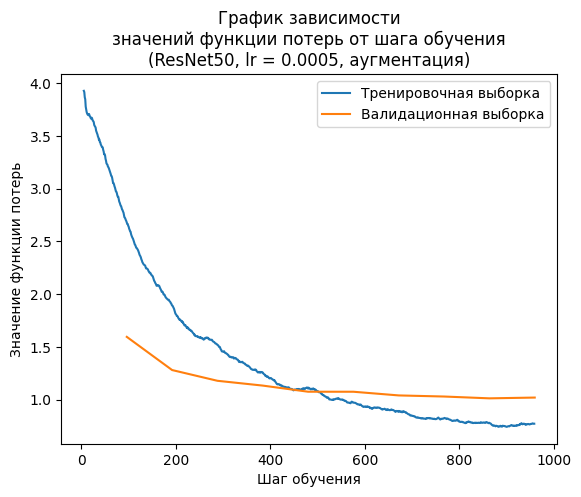


(ResNet50, lr = 0.002, аугментация)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.168418,1.374083,0.588462,0.590805,0.588462,0.584082,00:47
1,1.646082,1.200671,0.617949,0.615869,0.617949,0.614299,00:47
2,1.286711,1.092073,0.647436,0.649074,0.647436,0.643438,00:47
3,1.040207,1.026559,0.676923,0.687704,0.676923,0.676427,00:47
4,0.926951,1.003855,0.674359,0.684621,0.674359,0.671159,00:47
5,0.790714,0.923618,0.696154,0.697041,0.696154,0.693033,00:47
6,0.686849,0.925804,0.689744,0.692782,0.689744,0.688256,00:48
7,0.577667,0.938832,0.688462,0.701692,0.688462,0.690194,00:47
8,0.527664,0.941382,0.688462,0.695017,0.688462,0.687241,00:47
9,0.501915,0.941234,0.692308,0.701424,0.692308,0.691513,00:47


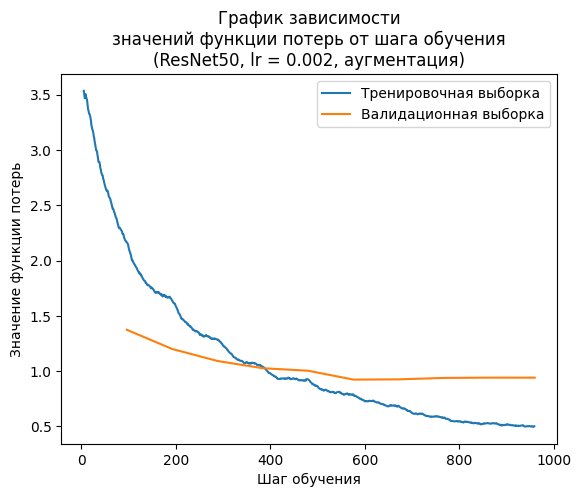


(ResNet50, lr = 0.01, аугментация)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.898901,1.387191,0.584615,0.592623,0.584615,0.579326,00:47
1,1.430943,1.185064,0.642308,0.645407,0.642308,0.630733,00:47
2,1.262146,1.072766,0.671795,0.690517,0.671795,0.669185,00:47
3,1.100881,1.085397,0.641026,0.686099,0.641026,0.642978,00:47
4,0.923410,1.047340,0.653846,0.682110,0.653846,0.658628,00:47
5,0.789116,0.954739,0.678205,0.695834,0.678205,0.681095,00:47
6,0.675129,0.903491,0.705128,0.713416,0.705128,0.705930,00:47
7,0.549166,0.933426,0.705128,0.718064,0.705128,0.706432,00:47
8,0.456291,0.926882,0.696154,0.714287,0.696154,0.696850,00:47
9,0.400208,0.933848,0.706410,0.723415,0.706410,0.705726,00:47


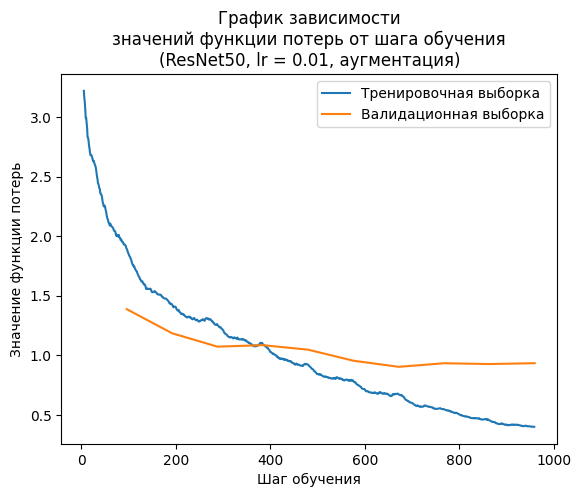

In [ ]:
dls = image_loader(batch_tfms=aug_transforms(flip_vert=True))

for lr_value in [5e-4, 2e-3, 1e-2]:
    print(f'\n(ResNet50, lr = {lr_value}, аугментация)')
    learn = vision_learner(
        dls, resnet50, lr=lr_value, metrics=METRIC_LIST).to_fp16()
    learn.fit_one_cycle(10)
    plotting_loss(f'\n(ResNet50, lr = {lr_value}, аугментация)')

В ходе обучения модели на основе предобученной нейросети ResNet50 на изображениях с применённой аугментацией (без изменения размера изображений)
- при скорости обучения 5$\cdot$10$^{-4}$ 
    - значение правильности увеличилось до 0,656&ndash;0,664,
    - значение функции потерь на валидационной выборке почти монотонно снижалось с 1,59 до 1,02,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,69 до 0,77;
- при скорости обучения 2$\cdot$10$^{-3}$ 
    - значение правильности увеличилось до 0,688&ndash;0,692,
    - значение функции потерь на валидационной выборке снизилось с 1,37 до 0,94,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,17 до 0,50;
- при скорости обучения 1$\cdot$10$^{-2}$ 
    - значение правильности увеличилось до 0,696&ndash;0,706,
    - значение функции потерь на валидационной выборке снизилось с 1,39 до 0,93,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 1,90 до 0,40.

##### Аугментация с изменением размера изображения

Теперь произведём изменение размера изображений с 300 пикселей до 224 пикселей (форма изображения &mdash; квадратная).

Изменять размер будем для каждого изображения перед формированием из них порций (батчей) загрузчиком. Для этого передадим функцию `Resize` со значением 224 параметру `item_tfms` загрузчика.

Проведём обучение только одной нейросети на основе ResNet50 со скоростью обучения 1$\cdot$10$^{-2}$, поскольку она продемонстрировала высокое качество предсказания.


(ResNet50, lr = 0.01, аугментация + resize)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.062016,1.504567,0.558974,0.552616,0.558974,0.548035,00:35
1,1.580826,1.350398,0.548718,0.559184,0.548718,0.545542,00:36
2,1.388273,1.222875,0.628205,0.647778,0.628205,0.622112,00:36
3,1.159626,1.126153,0.626923,0.636576,0.626923,0.619698,00:36
4,1.022866,1.028803,0.656410,0.664306,0.656410,0.654733,00:36
5,0.859077,1.086648,0.656410,0.681816,0.656410,0.658174,00:36
6,0.749442,1.000615,0.679487,0.686359,0.679487,0.678502,00:37
7,0.635560,1.011398,0.688462,0.694533,0.688462,0.686177,00:36
8,0.546037,1.024332,0.678205,0.686090,0.678205,0.676753,00:36
9,0.493926,1.022660,0.683333,0.699230,0.683333,0.685126,00:35


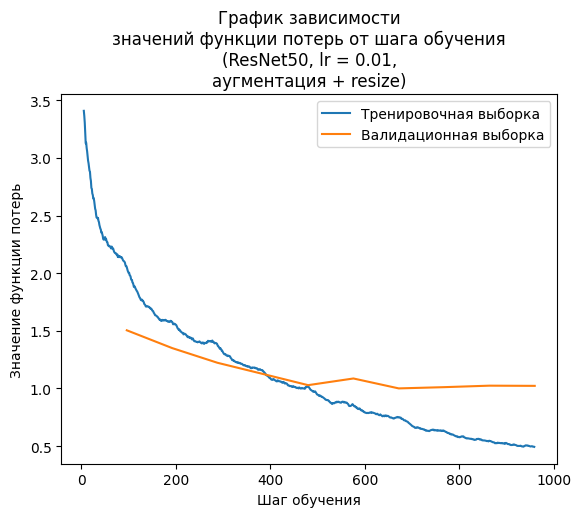

In [ ]:
dls = image_loader(item_tfms=Resize(224),
                   batch_tfms=aug_transforms(flip_vert=True))
print('\n(ResNet50, lr = 0.01, аугментация + resize)')
learn = vision_learner(
    dls, resnet50, lr=0.01, metrics=METRIC_LIST).to_fp16()
learn.fit_one_cycle(10)
plotting_loss('\n(ResNet50, lr = 0.01,\nаугментация + resize)')

В ходе обучения модели на основе предобученной нейросети ResNet50 на изображениях с применённой аугментацией и изменённым размером изображения до 224 пикселей
- при скорости обучения 1$\cdot$10$^{-2}$ 
    - значение правильности увеличилось до 0,678&ndash;0,688,
    - значение функции потерь на валидационной выборке снизилось с 1,50 до 1,02,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,06 до 0,49.

Теперь применим другой способ изменения размера изображений, предложенный авторами библиотеки *fastai*, описанный в документации к ней.

Размер каждого изображения будем сначала изменять с 300 пикселей до 460 пикселей до формирования порций (батчей) изображений загрузчиком. А затем в каждой сформированной порции (батче) изображений изменим размер изображения до 224.


(ResNet50, lr = 0.01, аугментация + resize x 2)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.057422,1.426924,0.578205,0.582276,0.578205,0.575860,00:45
1,1.535018,1.317734,0.583333,0.574527,0.583333,0.571507,00:37
2,1.372975,1.230139,0.612821,0.622449,0.612821,0.608828,00:36
3,1.151196,1.095298,0.650000,0.662092,0.650000,0.651970,00:36
4,0.983735,1.049515,0.666667,0.678983,0.666667,0.662541,00:36
5,0.862559,0.998040,0.656410,0.666592,0.656410,0.656649,00:36
6,0.752890,0.938545,0.694872,0.697589,0.694872,0.695027,00:36
7,0.637727,0.949250,0.694872,0.700172,0.694872,0.694508,00:36
8,0.546932,0.965581,0.682051,0.691857,0.682051,0.681182,00:37
9,0.495665,0.968209,0.684615,0.691890,0.684615,0.682407,00:37


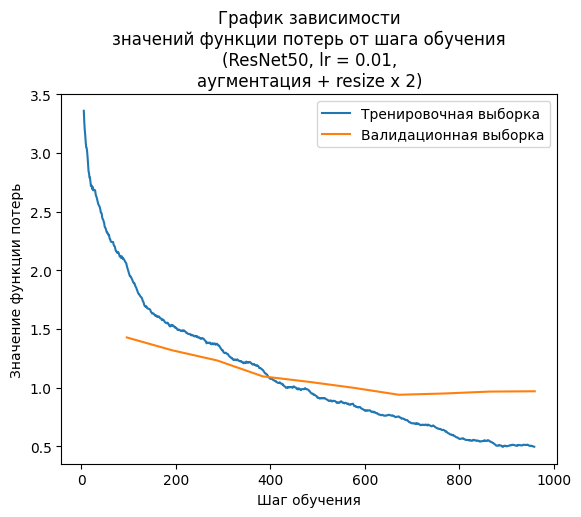

In [ ]:
dls = image_loader(item_tfms=Resize(460),
                   batch_tfms=aug_transforms(size=224, flip_vert=True))
print('\n(ResNet50, lr = 0.01, аугментация + resize x 2)')
learn = vision_learner(
    dls, resnet50, lr=0.01, metrics=METRIC_LIST).to_fp16()
learn.fit_one_cycle(10)
plotting_loss('\n(ResNet50, lr = 0.01,\nаугментация + resize x 2)')

В ходе обучения модели на основе предобученной нейросети ResNet50 на изображениях с применённой аугментацией и изменённым размером изображения сначала до 460 пикселей, а затем &mdash; до 224 пикселей
- при скорости обучения 1$\cdot$10$^{-2}$ 
    - значение правильности увеличилось до 0,682&ndash;0,695,
    - значение функции потерь на валидационной выборке снизилось с 1,43 до 0,97,
    - значение функции потерь на тренировочной выборке монотонно снижалось с 2,06 до 0,50.

**Промежуточный вывод**

- Использование аугментации изображений (без изменения размера изображений) по-разному влияет на качество предсказательной способности моделей на основе ResNet50.

---

*Таблица*. Значения правильности для моделей на основе ResNet50, обученных при разных скоростях, с аугментацией и без неё.

|Скорость обучения|Правильность (без аугментации)|Правильность (с аугментацией)|
|:---:|:---:|:---:|
|5$\cdot$10$^{-4}$|0,675&ndash;0,679|0,656&ndash;0,664|
|2$\cdot$10$^{-3}$|0,686&ndash;0,690|0,688&ndash;0,692|
|1$\cdot$10$^{-2}$|0,687&ndash;0,692|0,696&ndash;0,706|

---

- Для моделей, обучаемых на скорости 5$\cdot$10$^{-4}$,  наблюдается снижение значения правильности с 0,679 до 0,664 при применении аугментации к изображениям. На качество моделей, обучаемых на скорости 2$\cdot$10$^{-3}$, применение аугментации не оказывает особого влияния. Значение правильности остаётся на уровне 0,690.
- А вот использование аугментации изображений перед подачей их модели, обучающейся на скорости 1$\cdot$10$^{-2}$, приводит к увеличению значения правильности с 0,694 до 0,706, что свидетельствует об улучшении предсказательной способности моделей на основе ResNet50.

---

*Таблица*. Значения функции потерь на обучающей выборке для моделей на основе ResNet50, обученных при разных скоростях, с аугментацией и без неё.

|Скорость обучения|Потери (без аугментации)|Потери (с аугментацией)|
|:---:|:---:|:---:|
|5$\cdot$10$^{-4}$|0,30|0,77|
|2$\cdot$10$^{-3}$|0,13|0,50|
|1$\cdot$10$^{-2}$|0,09|0,40|

---

- Кроме того, использование аугментации увеличивает значение функции потерь на обучающей выборке на последней эпохе обучения (как минимум, до 0,40 &mdash; при скорости обучения 1$\cdot$10$^{-2}$), что свидетельствует об отсутствии переобучения. И это также даёт возможность настроить дополнительные параметры для улучшения качества предсказания.


- Изменение размера изображений не способствует улучшению качества предсказания моделей и не приводит к росту значения правильности.

---

*Таблица*. Значения правильности для моделей на основе ResNet50, обученных на скорости 1$\cdot$10$^{-2}$, с применённой к изображениям аугментацией и изменением размера изображений.

|Модель ResNet50 (скорость обучения: 1$\cdot$10$^{-2}$)|Правильность|
|:---|:---:|
|- с аугментацией без изменения размера|0,696&ndash;0,706|
|- с аугментацией и изменением размера|0,678&ndash;0,688|
|- с аугментацией и изменением размера дважды|0,682&ndash;0,695|

---

Таким образом, для дальнейшего исследования будем использовать модель ResNet50, обученную на скорости 1$\cdot$10$^{-2}$, с применённой к изображениям аугментацией по умолчанию и дополнительно применённым двугранным переворотом без изменения размера изображений.

#### Подбор количества эпох

Увеличение количества эпох обычно приводит к более точному подбору значений параметров нейросети и позволяет повысить качество её предсказаний. В то же время, необходимо учитывать тот факт, что значительное увеличение количества эпох может привести к переобучению нейросети.


(ResNet50, lr = 0.01, аугментация)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.947557,1.328555,0.603846,0.627338,0.603846,0.604150,00:47
1,1.490929,1.246127,0.591026,0.603174,0.591026,0.592064,00:47
2,1.211060,1.197350,0.642308,0.647480,0.642308,0.639059,00:47
3,1.215380,1.239146,0.617949,0.638972,0.617949,0.620782,00:47
4,1.097992,1.085927,0.655128,0.661167,0.655128,0.646026,00:47
5,0.977341,1.045548,0.666667,0.686266,0.666667,0.668806,00:47
6,0.884288,1.029104,0.683333,0.694638,0.683333,0.682453,00:47
7,0.802774,1.088433,0.665385,0.704331,0.665385,0.664992,00:47
8,0.724878,0.990309,0.697436,0.693246,0.697436,0.691799,00:47
9,0.682599,1.021229,0.692308,0.698245,0.692308,0.691805,00:47


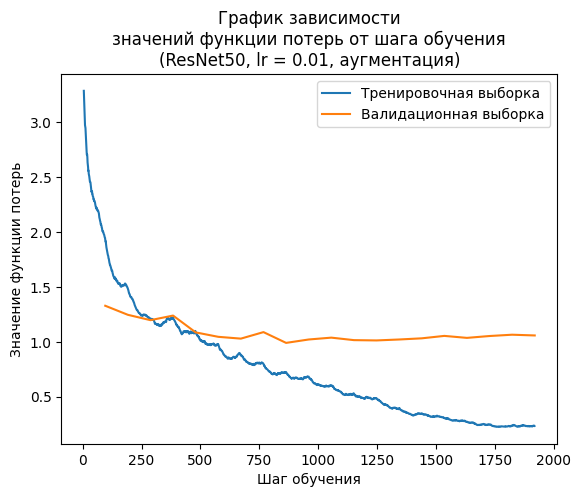


(ResNet50, lr = 0.01, аугментация)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.939389,1.292452,0.612821,0.611020,0.612821,0.609440,00:47
1,1.472945,1.164614,0.626923,0.637229,0.626923,0.628827,00:47
2,1.224031,1.095781,0.652564,0.665835,0.652564,0.649477,00:47
3,1.114125,1.083116,0.657692,0.672905,0.657692,0.657592,00:47
4,1.094736,1.135027,0.632051,0.634480,0.632051,0.625054,00:47
5,1.077288,1.081127,0.653846,0.676018,0.653846,0.649069,00:48
6,0.970263,1.087189,0.661538,0.683924,0.661538,0.662557,00:48
7,0.916169,0.947029,0.694872,0.710387,0.694872,0.696761,00:49
8,0.870732,0.937897,0.691026,0.700628,0.691026,0.689538,00:48
9,0.750046,1.016584,0.675641,0.698075,0.675641,0.674075,00:49


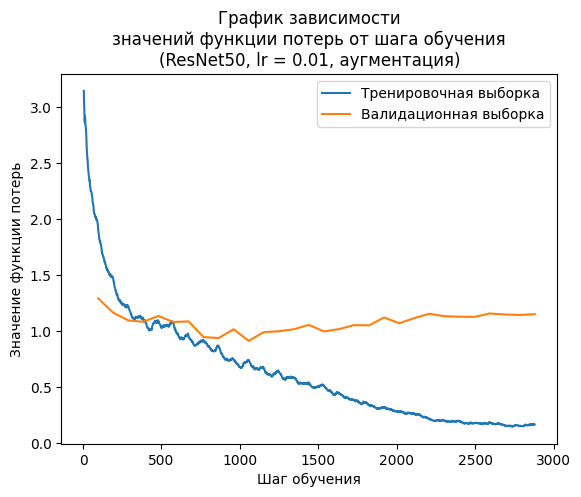

In [ ]:
dls = image_loader(batch_tfms=aug_transforms(flip_vert=True))

for epoch_number in [20, 30]:
    print('\n(ResNet50, lr = 0.01, аугментация)')
    learn = vision_learner(
        dls, resnet50, lr=0.01, metrics=METRIC_LIST).to_fp16()
    learn.fit_one_cycle(epoch_number)
    plotting_loss('\n(ResNet50, lr = 0.01, аугментация)')

В ходе обучения модели на основе предобученной нейросети ResNet50 на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$
- в течение 20 эпох
    - значение правильности увеличилось до 0,723&ndash;0,728,
    - значение функции потерь на валидационной выборке снизилось с 1,33 до 1,06, причём минимальное значение 0,99 было достигнуто после 9-й эпохи обучения, после чего начался постепенный рост до значения 1,06,
    - значение функции потерь на тренировочной выборке почти монотонно снижалось с 1,95 до 0,23,
- в течение 30 эпох
    - значение правильности увеличилось до 0,714&ndash;0,717,
    - значение функции потерь на валидационной выборке снизилось с 1,29 до 1,15, причём минимальное значение 0,91 было достигнуто после 11-й эпохи обучения, после чего начался постепенный рост до значения 1,15,
    - значение функции потерь на тренировочной выборке почти монотонно снижалось с 1,94 до 0,17.

**Промежуточный выбор**

- Увеличение количества эпох обучения нейросети по-разному оказывает влияние на качество её предсказательной способности.

---

*Таблица*. Значения правильности для моделей на основе ResNet50, дообученных на изображениях с применённой аугментацией, при скорости обучения 1$\cdot$10$^{-2}$, в течение разного количества эпох.

|Количество эпох|Правильность|
|:---:|:---:|
|10|0,696&ndash;0,706|
|20|0,723&ndash;0,728|
|30|0,714&ndash;0,717|

---

- Увеличение количества эпох обучения позволяет увеличить значение правильности. Так, при увеличении количества эпох с 10 до 20 значение правильности может возрастать с 0,706 до 0,728.
- Однако при дальнейшем увеличении количества эпох наблюдается снижение прироста значения правильности. Так, при увеличении количества эпох с 10 до 30 значение правильности возрастает только до 0,717.

---

*Таблица*. Значения функции потерь на обучающей и валидационной выборках после последней эпохи обучения, полученные для моделей на основе ResNet50, дообученных на изображениях с применённой аугментацией, при скорости обучения 1$\cdot$10$^{-2}$, в течение разного количества эпох.

|Количество эпох|Потери при обучении|Потери при валидации|
|:---:|:---:|:---:|
|10|0,40|0,93|
|20|0,23|1,06|
|30|0,17|1,15|

---

- Кроме того, с ростом числа эпох наблюдается уменьшение значения функции потерь на обучающей выборке после последней эпохи: с 0,4 при 10 эпохах до 0,23 при 20 эпохах и до 0,17 при 30 эпохах.
- С другой стороны, значение функции потерь после последней эпохи на валидационной выборке возрастает с увеличением количества эпох. Но поскольку в ходе обучения нейросетей наблюдалось снижение значения функции потерь на валидационной выборке где-то около 10-й эпохи до значения порядка 0,95, то можно ожидать, что дальнейшее исследование по подбору параметров будет способствовать также снижению значений функции потерь на валидационной выборке.

Таким образом, для дальнейшего исследования будем использовать модель ResNet50, обученную в течение 20 эпох на скорости 1$\cdot$10$^{-2}$, с применённой к изображениям аугментацией по умолчанию и дополнительно применённым двугранным переворотом, без изменения размера изображений.

#### Выбор функции потерь

Изменение функции потерь может быть необходимо для оптимизации процесса обучения и улучшения качества предсказаний модели. До этого момента построения всех моделей производились с функцией потерь по умолчанию.

In [ ]:
print('Функция потерь (по умолчанию):', learn.loss_func)

Функция потерь (по умолчанию): FlattenedLoss of CrossEntropyLoss()


В библиотеке *fastai* по умолчанию в качестве функции потерь реализована кросс-энтропия (CrossEntropyLoss). С применением этой функции модель будет штрафоваться сильнее в случае, если вероятность неправильного ответа высокая, а вероятность правильного ответа низкая.

##### LabelSmoothingCrossEntropy

Помимо кросс-энтропии (CrossEntropyLoss) в библиотеке *fastai* реализована кросс-энтропийная функция потерь со сглаженными метками (LabelSmoothingCrossEntropy). Сглаживание меток &mdash; это метод регуляризации, который состоит в замене точных числовых меток целевой переменной 0 и 1 несколько "размытыми" значениями, расположенными около них &mdash; немного меньшими и немного большими значениями. Поэтому модель предсказывает классы более осторожно. Такое сглаживание помогает предотвратить переобучение и делает модель более устойчивой к зашумленным или ошибочным меткам в обучающих данных.


(ResNet50, lr = 0.01, аугментация, LabelSmoothingCrossEntropy)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.278098,1.650031,0.601282,0.611133,0.601282,0.596475,00:49
1,1.791362,1.473229,0.597436,0.608081,0.597436,0.596210,00:48
2,1.525662,1.375432,0.632051,0.636466,0.632051,0.622541,00:49
3,1.475833,1.401483,0.641026,0.653185,0.641026,0.633874,00:49
4,1.403953,1.330885,0.642308,0.657822,0.642308,0.640469,00:49
5,1.283869,1.285303,0.671795,0.694637,0.671795,0.668603,00:49
6,1.206672,1.242392,0.716667,0.718045,0.716667,0.707376,00:49
7,1.136516,1.208361,0.702564,0.715913,0.702564,0.703683,00:48
8,1.105107,1.283555,0.688462,0.697561,0.688462,0.685520,00:49
9,1.060433,1.236630,0.703846,0.715976,0.703846,0.699720,00:49


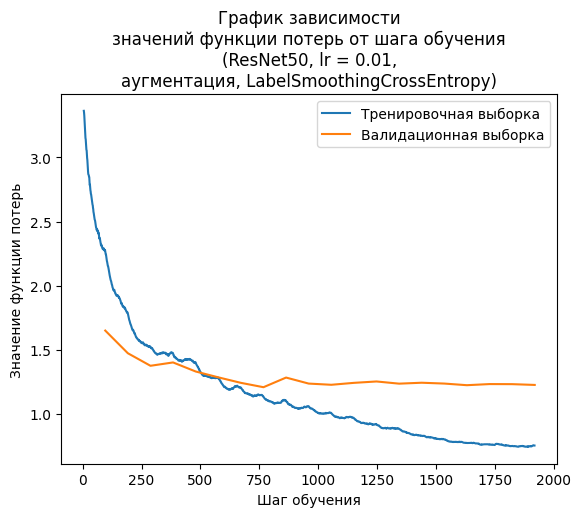

In [ ]:
dls = image_loader(batch_tfms=aug_transforms(flip_vert=True))
print('\n(ResNet50, lr = 0.01, аугментация, LabelSmoothingCrossEntropy)')
learn = vision_learner(
    dls, resnet50, lr=0.01, metrics=METRIC_LIST,
    loss_func=LabelSmoothingCrossEntropy()).to_fp16()
learn.fit_one_cycle(20)
plotting_loss('\n(ResNet50, lr = 0.01,' +
              '\nаугментация, LabelSmoothingCrossEntropy)')

В ходе обучения в течение 20 эпох модели на основе предобученной нейросети ResNet50 на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$
- с использованием LabelSmoothingCrossEntropy в качестве функции потерь
    - значение правильности увеличилось до 0,699&ndash;0,703,
    - значение функции потерь на валидационной выборке снизилось с 1,65 до 1,23,
    - значение функции потерь на тренировочной выборке почти монотонно снижалось с 2,28 до 0,75.

##### FocalLoss

Ещё одной функцией потерь, реализованной в библиотеке *fastai*, является фокусирующая функция потерь (FocalLoss). Функция фокусирует обучение модели на небольшом наборе сложных негативных примеров классификации и уменьшает вес простых для классификации примеров.

$FL(p_t)=-(1-p_t)^{\gamma}log(p_t)$,

где $p_t$ &mdash; вероятность правильной классификации,
<br>$\gamma$ &mdash; фокусирующий параметр.

Фокусирующая функция была разработана как улучшение бинарной кросс-энтропии для решения задач несбалансированной классификации.


(ResNet50, lr = 0.01, аугментация, FocalLoss)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.702593,1.076184,0.578205,0.588717,0.578205,0.573166,00:49
1,1.184749,0.887874,0.605128,0.625556,0.605128,0.604701,00:49
2,0.924537,0.872295,0.601282,0.608136,0.601282,0.598612,00:48
3,0.852917,0.852751,0.637179,0.650727,0.637179,0.628984,00:49
4,0.787622,0.739771,0.662821,0.657627,0.662821,0.655140,00:48
5,0.674704,0.738307,0.647436,0.679825,0.647436,0.652442,00:49
6,0.590663,0.630448,0.684615,0.699182,0.684615,0.679430,00:48
7,0.510476,0.646328,0.689744,0.706488,0.689744,0.690134,00:49
8,0.448906,0.657187,0.689744,0.700317,0.689744,0.687118,00:48
9,0.411121,0.625960,0.689744,0.717518,0.689744,0.694047,00:49


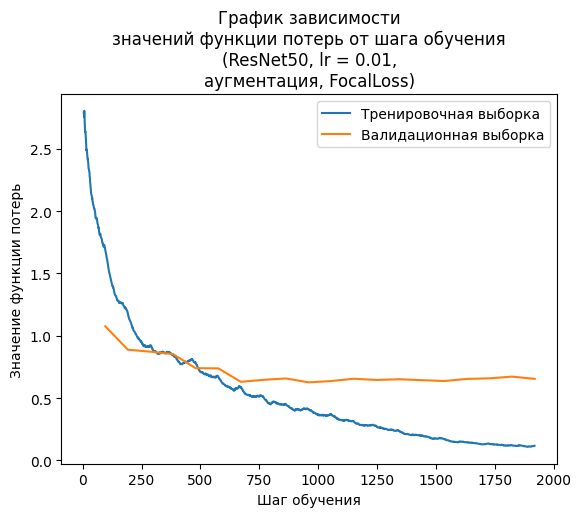

In [ ]:
dls = image_loader(batch_tfms=aug_transforms(flip_vert=True))
print('\n(ResNet50, lr = 0.01, аугментация, FocalLoss)')
learn = vision_learner(
    dls, resnet50, lr=0.01, metrics=METRIC_LIST,
    loss_func=FocalLoss()).to_fp16()
learn.fit_one_cycle(20)
plotting_loss('\n(ResNet50, lr = 0.01,' +
              '\nаугментация, FocalLoss)')

В ходе обучения в течение 20 эпох модели на основе предобученной нейросети ResNet50 на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$
- с использованием FocalLoss в качестве функции потерь
    - значение правильности увеличилось до 0,728&ndash;0,732,
    - значение функции потерь на валидационной выборке снизилось с 1,08 до 0,65,
    - значение функции потерь на тренировочной выборке почти монотонно снижалось с 1,70 до 0,12.

$-$ **Подбор параметра gamma**

В фокусирующей функции вводится дополнительный множитель, модулирующий (изменяющий) кросс-энтропийную функцию: $(1-p_k)^{\gamma}$. Когда наблюдение классифицировано с ошибкой, вероятность $p_t$ стремится к 0, модулирующий множитель приближается к 1, и потери не изменяются. При стремлении вероятности $p_t$ к 1, т. е. для правильно классифицированных наблюдений, модулирующий множитель приближается к 0 и потери снижаются.

Степень влияния этого модулирующего множителя контролируется с помощью параметра фокусировки $\gamma$. Параметр фокусировки плавно регулирует скорость снижения веса простых примеров. При $\gamma=0$ фокусирующая функция потерь эквивалентна кросс-энтропийной функции потерь. По мере увеличения $\gamma$ форма потерь меняется так, что «лёгкие» примеры с низкими потерями ещё больше игнорируются.

Экспериментально установлено, что наилучшее качество достигается при значении $\gamma$ равном 2, которое и реализовано по умолчанию в библиотеке *fastai*. Однако в исследовательских целях необходимо проверить, как влияет увеличение $\gamma$ на качество предсказательной способности моделей.


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=3))


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.601906,0.947953,0.573077,0.571580,0.573077,0.566629,00:49
1,1.081291,0.777449,0.619231,0.631709,0.619231,0.617254,00:48
2,0.857669,0.673310,0.629487,0.635887,0.629487,0.625867,00:49
3,0.815212,0.719767,0.594872,0.639681,0.594872,0.596256,00:49
4,0.696897,0.593500,0.657692,0.662802,0.657692,0.650801,00:48
5,0.599653,0.632155,0.638462,0.678145,0.638462,0.629883,00:48
6,0.487139,0.530595,0.670513,0.700879,0.670513,0.678070,00:48
7,0.429356,0.550681,0.673077,0.708094,0.673077,0.675794,00:48
8,0.381117,0.527368,0.676923,0.704127,0.676923,0.676794,00:49
9,0.338785,0.526971,0.682051,0.700752,0.682051,0.684124,00:48


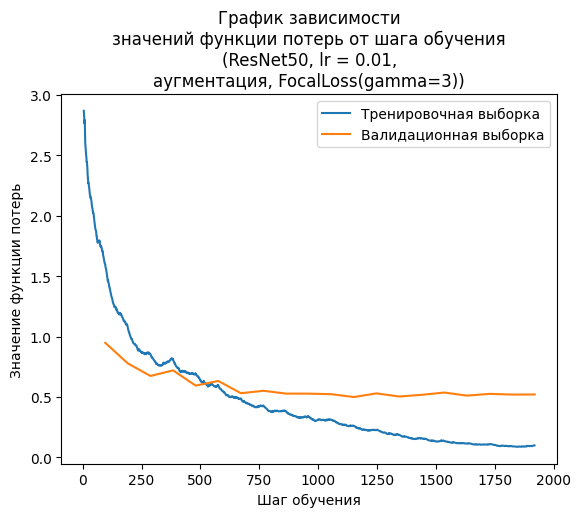


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=4))


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.492537,0.794922,0.605128,0.612190,0.605128,0.604708,00:47
1,1.012355,0.726445,0.606410,0.607436,0.606410,0.602601,00:47
2,0.782859,0.566132,0.626923,0.635407,0.626923,0.627466,00:47
3,0.730371,0.669116,0.612821,0.624001,0.612821,0.601130,00:47
4,0.651467,0.568615,0.651282,0.686500,0.651282,0.657511,00:47
5,0.477667,0.477008,0.671795,0.698008,0.671795,0.674116,00:47
6,0.413570,0.474846,0.664103,0.697802,0.664103,0.667276,00:47
7,0.365807,0.457284,0.676923,0.695863,0.676923,0.678071,00:47
8,0.312198,0.470128,0.683333,0.697104,0.683333,0.685834,00:47
9,0.299017,0.421774,0.707692,0.724469,0.707692,0.709998,00:47


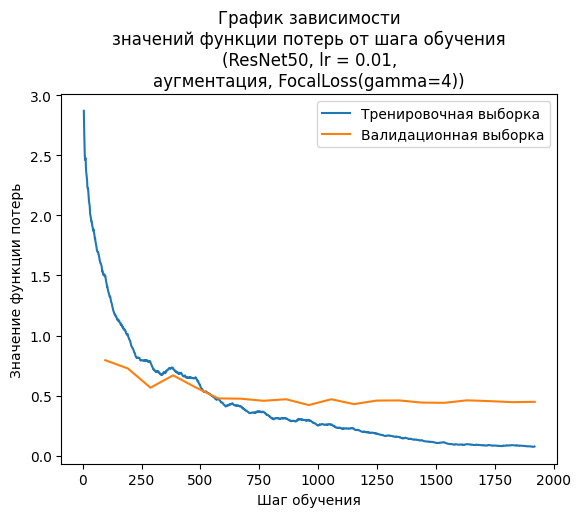


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=5))


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.461105,0.814775,0.569231,0.585545,0.569231,0.570722,00:47
1,0.987441,0.653033,0.575641,0.583631,0.575641,0.573497,00:47
2,0.725976,0.563446,0.600000,0.614395,0.600000,0.601954,00:47
3,0.636788,0.552069,0.626923,0.637178,0.626923,0.623776,00:47
4,0.567614,0.527607,0.626923,0.647345,0.626923,0.619884,00:47
5,0.455930,0.456592,0.639744,0.665027,0.639744,0.640794,00:47
6,0.355911,0.437886,0.655128,0.689652,0.655128,0.657306,00:47
7,0.312118,0.394397,0.675641,0.699189,0.675641,0.677882,00:47
8,0.288327,0.411662,0.671795,0.689992,0.671795,0.671580,00:47
9,0.246023,0.437164,0.678205,0.710198,0.678205,0.676434,00:47


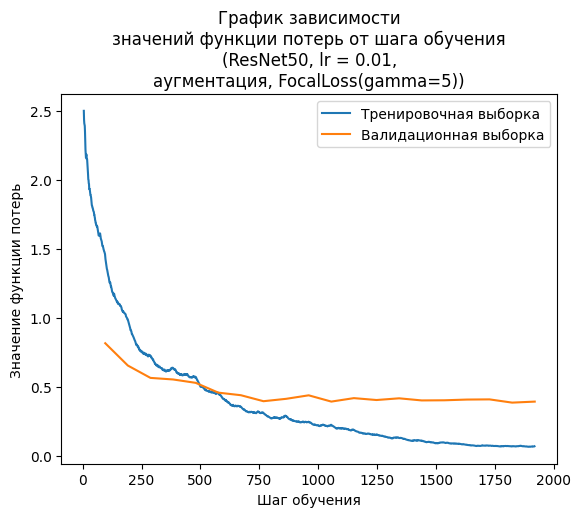


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=6))


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.469626,0.800867,0.575641,0.597611,0.575641,0.578051,00:47
1,0.946638,0.614970,0.591026,0.611209,0.591026,0.592363,00:47
2,0.651644,0.482396,0.592308,0.623576,0.592308,0.595827,00:47
3,0.591198,0.461518,0.612821,0.636402,0.612821,0.613734,00:47
4,0.507579,0.456332,0.643590,0.656196,0.643590,0.646124,00:47
5,0.403561,0.383108,0.646154,0.669658,0.646154,0.646456,00:47
6,0.307943,0.320765,0.669231,0.688939,0.669231,0.674473,00:47
7,0.282244,0.365932,0.655128,0.685064,0.655128,0.654387,00:47
8,0.238441,0.308554,0.680769,0.703433,0.680769,0.686618,00:47
9,0.209826,0.321017,0.692308,0.693539,0.692308,0.690095,00:47


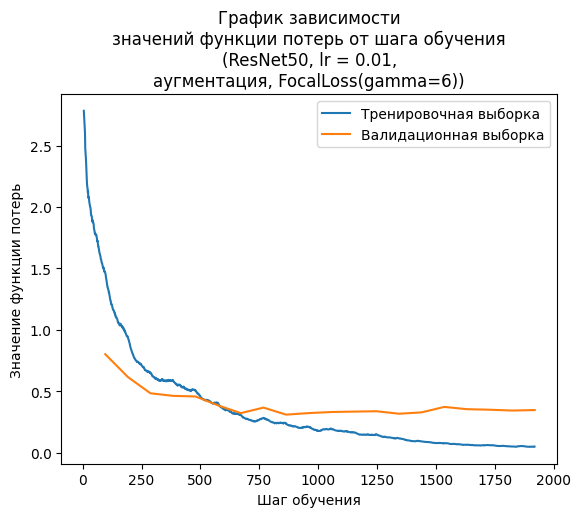

In [ ]:
dls = image_loader(batch_tfms=aug_transforms(flip_vert=True))

for gamma_value in [3, 4, 5, 6]:
    print(f'\n(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma={gamma_value}))')
    learn = vision_learner(
        dls, resnet50, lr=0.01, metrics=METRIC_LIST,
        loss_func=FocalLoss(gamma=gamma_value)).to_fp16()
    learn.fit_one_cycle(20)
    plotting_loss('\n(ResNet50, lr = 0.01,' +
                  f'\nаугментация, FocalLoss(gamma={gamma_value}))')

В ходе обучения в течение 20 эпох моделей на основе ResNet50 на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$ и фокусирующей функцией потерь установлено, что лучшее качество предсказания достигается при значении фокусирующего параметра $\gamma$ равного 2.

---

*Таблица*. Значения правильности для моделей ResNet50, дообученных в течение 20 эпох на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$ и фокусирующей функцией потерь при различных значениях параметра фокусировки $\gamma$.

|Параметр $\gamma$|Правильность|
|:---:|:---:|
|2|0,728&ndash;0,732|
|3|0,708&ndash;0,723|
|4|0,709&ndash;0,710|
|5|0,690&ndash;0,700|
|6|0,709&ndash;0,715|

---

**Промежуточный вывод**

- Выбор функции потерь влияет на качество предсказательной способности моделей нейросети ResNet50, дообученных в течение 20 эпох на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$.

---

*Таблица*. Значения правильности для моделей ResNet50, дообученных в течение 20 эпох на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$ и различными функциями потерь.

|Функция потерь|Правильность|
|:---:|:---:|
|Кросс-энтропия|0,723&ndash;0,728|
|Кросс-энтропия со сглаженными метками|0,699&ndash;0,703|
|Фокусирующая функция|0,728&ndash;0,732|

---

- Изменение функции потерь на кросс-энтропию со сглаженными метками заметно снижает значение правильности с 0,728 до 0,703 и одновременно увеличивает значение функции потерь и на валидационной, и на обучающей выборке.
- Изменение функции потерь на фокусирующую функцию увеличивает значение правильности с 0,728 до 0,732 и значительно снижает значение функции потерь на валидационной выборке &mdash; до 0,65. Наилучшее качество предсказания достигается при значении фокусирующего параметра равного 2.

#### Использование замораживания слоёв

Для стабилизации процесса обучения нейросетей используют технику замораживания нижних слоёв нейросети (эпох). Это обычно делается для предотвращения обучения начальных слоёв сети, которые кодируют низкоуровневые признаки (края или углы изображений).

Возможность заморозить слои и, таким образом, выполнить тонкую настройку модели нейронной сети в библиотеке *fastai* реализованы в методе `fine_tune`.

Исследуем, как заморозка одного или нескольких слоёв нейронной сети ResNet50, дообученной в течение 20 эпох на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$ и фокусирующей функцией потерь с параметром фокусировки равным 2, повлияет на качество предсказаний. Количество замороженных слоёв будем изменять в пределах от 1 до 5 при сохранении общего числа слоёв равным 20.


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2),
замороженных эпох: 1)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.792502,1.124787,0.574359,0.566024,0.574359,0.565771,00:48


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.060783,0.812704,0.625641,0.625246,0.625641,0.617159,00:58
1,0.881555,0.724407,0.647436,0.648867,0.647436,0.642636,00:58
2,0.728271,0.666610,0.689744,0.692149,0.689744,0.685865,00:58
3,0.603273,0.668030,0.678205,0.687489,0.678205,0.676673,00:58
4,0.497535,0.631065,0.700000,0.712038,0.700000,0.701096,00:58
5,0.415187,0.678577,0.692308,0.705298,0.692308,0.689596,00:58
6,0.349533,0.637393,0.691026,0.706512,0.691026,0.692704,00:58
7,0.254135,0.622785,0.698718,0.710189,0.698718,0.697000,00:58
8,0.209872,0.637347,0.707692,0.727438,0.707692,0.711853,00:58
9,0.180600,0.652577,0.702564,0.711998,0.702564,0.704684,00:58


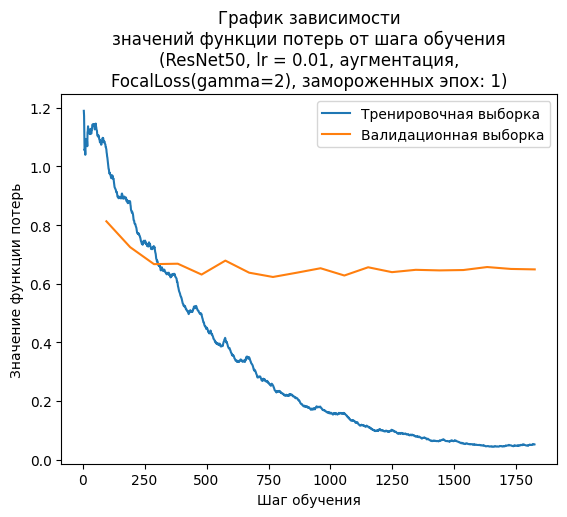


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2),
замороженных эпох: 2)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.834516,1.128895,0.588462,0.599037,0.588462,0.584918,00:47
1,1.354198,0.829696,0.617949,0.612642,0.617949,0.608631,00:47


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.762612,0.694828,0.673077,0.677624,0.673077,0.670006,00:58
1,0.655539,0.688981,0.665385,0.672748,0.665385,0.665164,00:58
2,0.582261,0.665013,0.673077,0.684669,0.673077,0.673272,00:58
3,0.506040,0.635878,0.674359,0.687044,0.674359,0.675740,00:58
4,0.423243,0.643500,0.685897,0.693590,0.685897,0.685379,00:58
5,0.355383,0.665750,0.676923,0.691492,0.676923,0.676949,00:58
6,0.283981,0.690355,0.664103,0.686080,0.664103,0.663634,00:58
7,0.227574,0.640348,0.683333,0.689851,0.683333,0.682509,00:58
8,0.172709,0.641708,0.701282,0.698392,0.701282,0.695649,00:58
9,0.151855,0.648983,0.698718,0.708392,0.698718,0.698355,00:58


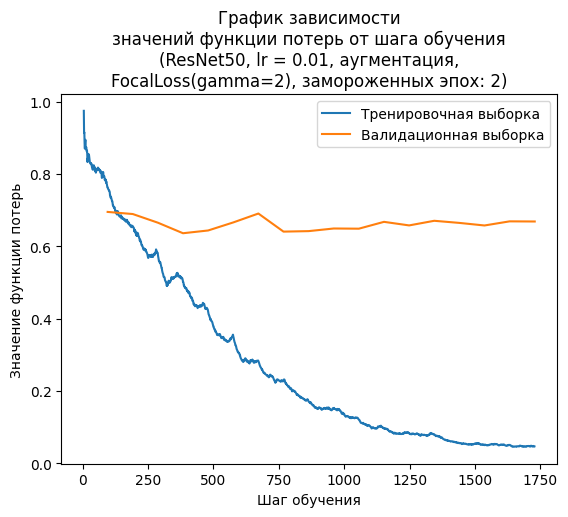


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2),
замороженных эпох: 3)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.966554,1.042336,0.573077,0.590957,0.573077,0.569319,00:47
1,1.423157,0.887440,0.617949,0.622837,0.617949,0.615944,00:47
2,1.072747,0.834721,0.608974,0.625257,0.608974,0.608370,00:47


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.663318,0.660451,0.647436,0.655841,0.647436,0.647609,00:58
1,0.593439,0.657475,0.657692,0.669260,0.657692,0.656363,00:58
2,0.520782,0.612359,0.688462,0.692379,0.688462,0.687563,00:58
3,0.467523,0.611384,0.682051,0.684544,0.682051,0.681482,00:58
4,0.367986,0.638712,0.701282,0.708912,0.701282,0.699336,00:58
5,0.308494,0.622722,0.697436,0.700321,0.697436,0.693531,00:58
6,0.257115,0.645156,0.701282,0.707361,0.701282,0.697921,00:58
7,0.207539,0.634874,0.705128,0.721417,0.705128,0.707233,00:58
8,0.156558,0.625312,0.717949,0.718565,0.717949,0.715262,00:58
9,0.129272,0.656327,0.708974,0.718974,0.708974,0.708709,00:58


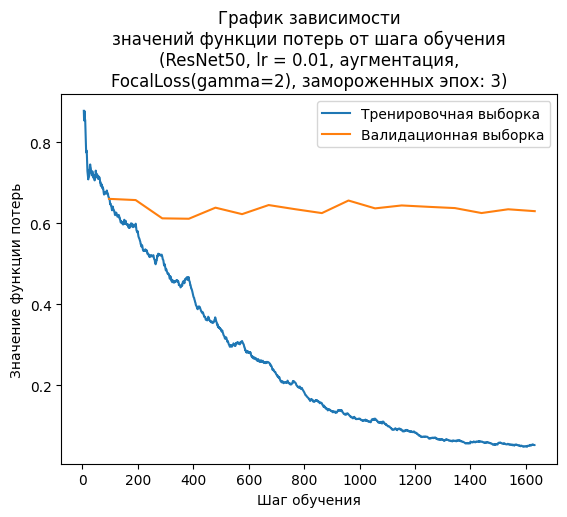


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2),
замороженных эпох: 4)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.048274,1.060186,0.548718,0.549897,0.548718,0.541881,00:47
1,1.455943,0.958172,0.592308,0.592653,0.592308,0.590245,00:47
2,1.134468,0.856573,0.619231,0.630723,0.619231,0.620907,00:47
3,0.902573,0.768674,0.611538,0.617066,0.611538,0.608678,00:47


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.622783,0.661865,0.657692,0.669082,0.657692,0.659113,00:58
1,0.521355,0.637258,0.671795,0.678186,0.671795,0.670641,00:58
2,0.448023,0.646666,0.685897,0.697630,0.685897,0.686478,00:58
3,0.417100,0.652893,0.679487,0.688221,0.679487,0.676232,00:58
4,0.340231,0.616468,0.700000,0.703238,0.700000,0.700176,00:58
5,0.280062,0.697135,0.683333,0.695943,0.683333,0.682119,00:58
6,0.227225,0.719027,0.689744,0.700328,0.689744,0.688657,00:58
7,0.185157,0.711921,0.698718,0.709974,0.698718,0.697439,00:58
8,0.152601,0.733290,0.697436,0.713873,0.697436,0.699216,00:58
9,0.117464,0.723138,0.694872,0.697387,0.694872,0.691118,00:58


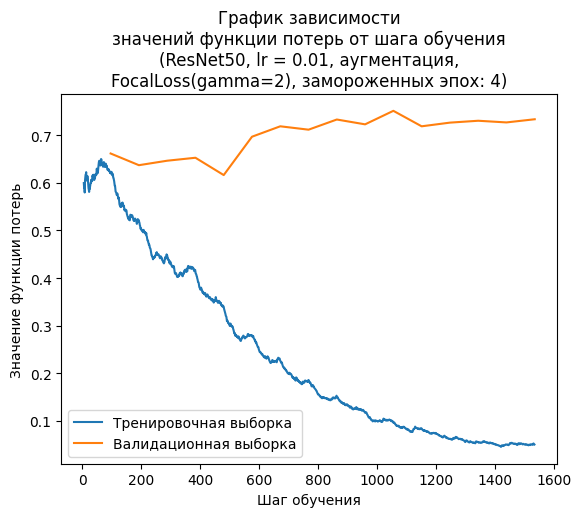


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2),
замороженных эпох: 5)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.063680,1.080970,0.548718,0.544812,0.548718,0.539313,00:47
1,1.505252,1.001258,0.580769,0.594472,0.580769,0.583452,00:47
2,1.186874,0.937009,0.598718,0.605415,0.598718,0.592774,00:47
3,0.992291,0.843609,0.639744,0.645058,0.639744,0.638552,00:47
4,0.785520,0.754112,0.634615,0.645412,0.634615,0.630763,00:47


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.560245,0.641245,0.660256,0.674804,0.660256,0.660820,00:58
1,0.477846,0.620330,0.680769,0.685220,0.680769,0.679828,00:58
2,0.438226,0.632783,0.675641,0.680247,0.675641,0.673444,00:58
3,0.382510,0.615364,0.693590,0.701392,0.693590,0.695440,00:58
4,0.341687,0.662760,0.675641,0.681132,0.675641,0.674050,00:58
5,0.252337,0.631846,0.696154,0.698645,0.696154,0.691903,00:58
6,0.202625,0.665974,0.710256,0.715756,0.710256,0.710128,00:58
7,0.164703,0.638714,0.702564,0.706191,0.702564,0.698937,00:58
8,0.142060,0.658201,0.714103,0.722464,0.714103,0.714593,00:58
9,0.108227,0.631166,0.729487,0.737419,0.729487,0.730204,00:58


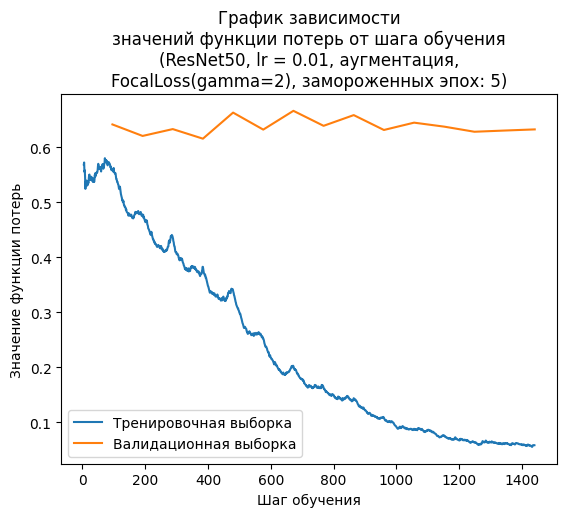

In [ ]:
dls = image_loader(batch_tfms=aug_transforms(flip_vert=True))

for freeze_number in range(1, 6):
    print('\n(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2),\n' +
          f'замороженных эпох: {freeze_number})')
    learn = vision_learner(
        dls, resnet50, lr=0.01, metrics=METRIC_LIST,
        loss_func=FocalLoss()).to_fp16()
    learn.fine_tune(20 - freeze_number, freeze_epochs=freeze_number)
    plotting_loss('\n(ResNet50, lr = 0.01, аугментация,\n' +
                  f'FocalLoss(gamma=2), замороженных эпох: {freeze_number})')

**Промежуточный вывод**

- Замораживание слоёв по-разному оказывает влияние на качество выполняемых моделями предсказаний.

---

*Таблица*. Значения правильности для моделей ResNet50, дообученных в течение 20 эпох на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$ и фокусирующей функцией потерь с параметром фокусировки равным 2 и различном количестве замороженных нижних слоёв.

|Кол-во замороженных слоёв|Правильность|
|:---:|:---:|
|0|0,728&ndash;0,732|
|1|0,724&ndash;0,735|
|2|0,705&ndash;0,713|
|3|0,727&ndash;0,736|
|4|0,696&ndash;0,708|
|5|0,717&ndash;0,727|

---

- Замораживание 2, 4 или 5 нижних слоёв нейросети приводит к снижению значения правильности.
- Замораживание 1 или 3 нижних слоёв нейросети приводит к небольшому росту значения правильности по сравнению с моделью, обученной без замораживания слоёв.
- Кроме того, для модели с тремя замороженными слоями на протяжении последних 4&ndash;5 эпох достаточно стабильно наблюдается высокое качество предсказания.
- В процессе обучения моделей с замороженными слоями на последнем слое функция потерь достигает значения 0,05 на тренировочной выборке. Однако это не является признаком переобучения модели, поскольку значение функции потерь на валидационной выборке остаётся на том же уровне &mdash; 0,65, как и для модели, обученной без замораживания слоёв.

Для использования рекомендуется модель ResNet50, дообученная в течение 20 эпох на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$, фокусирующей функцией потерь с параметром фокусировки равным 2 и тремя замороженными нижними слоями нейросети.

#### Обучение на сбалансированных данных

Поскольку обучение моделей производилось на выборке с дисбалансом классов, интерес представляет результат обучения модели и на сбалансированных данных.

In [ ]:
data_other['genre'].value_counts()

genre
country        1317
anime          1072
classical       862
jazz            734
pop             708
edm             631
reggae          533
disco           404
black metal     397
rap             295
Name: count, dtype: int64

В качестве выборки для обучения модели мы можем использовать только 2950 изображений, что определяется количеством изображений в наименее представленном классе `rap`.

Сформируем выборку для обучения.

In [ ]:
data_balanced = pd.DataFrame()

for genre_name in genres:
    data_balanced = pd.concat([
        data_balanced,
        data_other[data_other['genre'] == genre_name].sample(295, random_state=RANDOM_STATE)
    ])

data_balanced.shape

(2950, 9)

Обучим на сбалансированной выборке модель нейронной сети с подобранными ранее параметрами.


(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2),
замороженных эпох: 3, сбалансированные данные)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.487861,1.371828,0.522034,0.573430,0.522034,0.507600,00:21
1,1.832792,1.284518,0.538983,0.539101,0.538983,0.528662,00:21
2,1.420150,1.174168,0.566102,0.576481,0.566102,0.563912,00:21


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.809502,1.035699,0.566102,0.582753,0.566102,0.565678,00:25
1,0.681668,0.985322,0.596610,0.608298,0.596610,0.594591,00:25
2,0.562807,0.978944,0.610169,0.627354,0.610169,0.610276,00:25
3,0.489439,1.053031,0.593220,0.625773,0.593220,0.601986,00:25
4,0.441239,0.960899,0.600000,0.603578,0.600000,0.598392,00:25
5,0.381155,1.015560,0.616949,0.626922,0.616949,0.613655,00:25
6,0.325163,0.958131,0.647458,0.663124,0.647458,0.644923,00:25
7,0.266383,0.895738,0.640678,0.639222,0.640678,0.637819,00:25
8,0.207711,0.917566,0.647458,0.643037,0.647458,0.642990,00:25
9,0.163861,0.953073,0.644068,0.648380,0.644068,0.641139,00:25


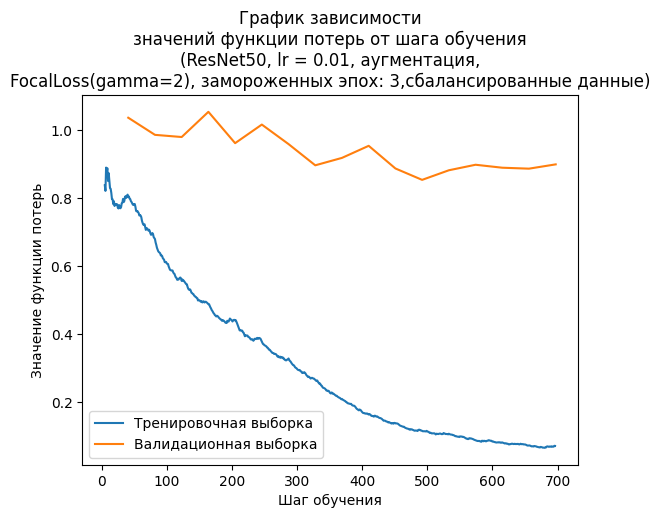

In [ ]:
dls = image_loader(df=data_balanced[['path', 'genre']],
                   valid_pct=0.1,
                   batch_tfms=aug_transforms(flip_vert=True))

print('\n(ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2),\n' +
      'замороженных эпох: 3, сбалансированные данные)')
learn = vision_learner(
    dls, resnet50, lr=0.01, metrics=METRIC_LIST,
    loss_func=FocalLoss()).to_fp16()
learn.fine_tune(17, freeze_epochs=3)
plotting_loss('\n(ResNet50, lr = 0.01, аугментация,\n' +
              'FocalLoss(gamma=2), замороженных эпох: 3,' +
              'сбалансированные данные)')

В ходе обучения в течение 20 эпох на сбалансированных данных модели нейросети ResNet50, предобученной на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$, фокусирующей функцией потерь с параметром фокусировки равным 2 и тремя замороженными слоями,
- значение правильности увеличилось до 0,675&ndash;0,681,
- значение функции потерь на валидационной выборке снизилось с 1,04 до 0,90,
- значение функции потерь на тренировочной выборке монотонно снижалось с 0,81 до 0,07.
    
**Промежуточный вывод**

- Качество обучения модели нейросети с подобранными параметрами на сбалансированных данных хоть и достигает довольно высоких значений, всё же не воспроизводит такового для модели, обученной на большем количестве наблюдений, хоть и не сбалансированном.
- Вполне возможно, что при увеличении сбалансированной выборки удастся достичь более высокого качества предсказательной способности обученной модели.

### Оценка модели

Для демонстрации предсказательной способности выбранной модели вновь проведём обучение нейросети.

In [ ]:
dls = image_loader(batch_tfms=aug_transforms(flip_vert=True))

print('ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2), ' +
      'замороженных эпох: 3')
learn = vision_learner(
    dls, resnet50, lr=0.01, metrics=METRIC_LIST,
    loss_func=FocalLoss()).to_fp16()
learn.fine_tune(17, freeze_epochs=3)

ResNet50, lr = 0.01, аугментация, FocalLoss(gamma=2), замороженных эпох: 3


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.968598,1.099000,0.573077,0.584172,0.573077,0.568555,00:49
1,1.409035,0.906029,0.614103,0.629948,0.614103,0.613960,00:47
2,1.073687,0.805281,0.623077,0.628880,0.623077,0.618515,00:47


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.689668,0.717383,0.641026,0.655471,0.641026,0.643291,00:58
1,0.582677,0.686082,0.653846,0.657709,0.653846,0.652283,00:58
2,0.506922,0.671247,0.673077,0.678415,0.673077,0.670060,00:58
3,0.448823,0.653040,0.683333,0.689152,0.683333,0.679585,00:58
4,0.383391,0.609192,0.696154,0.703112,0.696154,0.695060,00:58
5,0.315686,0.667367,0.687180,0.698777,0.687179,0.686155,00:58
6,0.258835,0.638784,0.693590,0.702064,0.693590,0.692417,00:58
7,0.204329,0.649619,0.703846,0.714434,0.703846,0.702785,00:58
8,0.161893,0.626930,0.697436,0.707493,0.697436,0.699530,00:58
9,0.130736,0.651862,0.710256,0.720987,0.710256,0.711007,00:58


Для того чтобы выполнить предсказание на тестовой выборке воспользуемся методом `test_dl` загрузчика. С методом также передадим датафрейм с колонками, содержащими путь к файлу с изображением, и метку класса, к которому оно относится.

In [ ]:
tst_dl = dls.test_dl(data_test[['path', 'genre']], with_labels=True)

Посмотрим, какие изображения попадают в загрузчик.

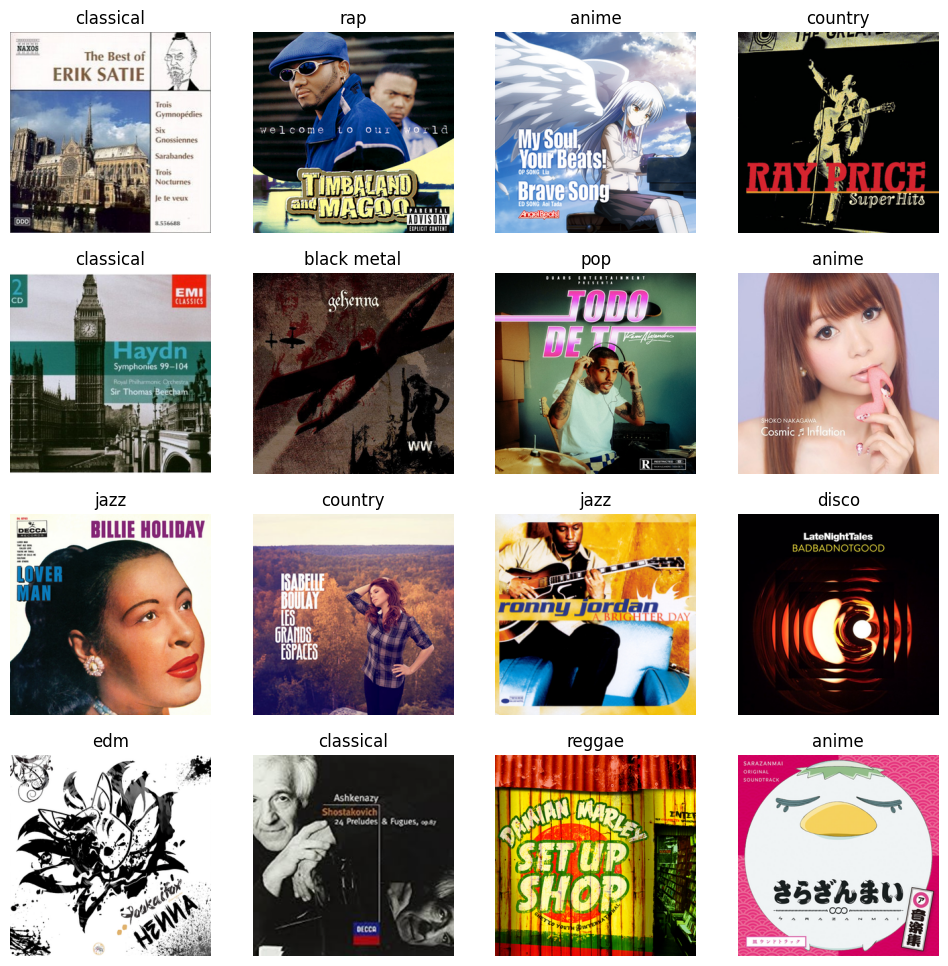

In [ ]:
tst_dl.show_batch(max_n=16)

С помощью метода `get_preds` получим предсказания модели для тестовой выборки. С помощью метода `argmax` получим из предсказаний закодированные числовыми значениями метки классов.

In [ ]:
preds, targs = learn.get_preds(dl=tst_dl)
pred_indices = preds.argmax(dim=1)
print('Правильность итоговой модели:',
      accuracy_score(targs, pred_indices).round(4))

Правильность итоговой модели: 0.7269


Выведем таблицу основных метрик классификации и матрицу ошибок.

In [ ]:
print('=' * 53, ' Таблица основных метрик классификации', '=' * 53,
      classification_report(targs, pred_indices, target_names=genres),
      '=' * 53, sep='\n')

 Таблица основных метрик классификации
              precision    recall  f1-score   support

       anime       0.91      0.89      0.90       112
 black metal       0.94      0.94      0.94        52
   classical       0.86      0.93      0.90        87
     country       0.78      0.78      0.78       165
       disco       0.61      0.39      0.47        59
         edm       0.60      0.69      0.64        64
        jazz       0.51      0.53      0.52        85
         pop       0.57      0.61      0.59        80
         rap       0.71      0.81      0.76        31
      reggae       0.61      0.51      0.55        45

    accuracy                           0.73       780
   macro avg       0.71      0.71      0.70       780
weighted avg       0.73      0.73      0.72       780



- Правильность обученной нейросети достигает значения 0,73 на тестовой выборке.
- Наименьшее значение F1-меры наблюдается для жанра `disco` (0,47). Для остальных жанров значение F1-меры превышает 0,5. Наибольшее значение F1-меры наблюдается для жанров `black metal` (0,94), `anime` (0,90), `classical` (0,90). Меньшее значение F1-меры наблюдается для жанров `country` (0,78) и `rap` (0,76).
- Жанры `classical`, `edm`, `rap` охватываются алгоритмом более полно, нежели точно: для них значение полноты выше значения точности.
- Жанры `disco`, `reggae`, наоборот, хоть и не полностью охватываются, но более метко распознаются алгоритмом: для них значение точности превышает значение полноты.
- Остальные жанры в одинаковой степени охватываются и распознаются алгоритмом, поэтому значения полноты и точности для них вносят равный вклад в значение F1-меры и по величине практически совпадают с ней.

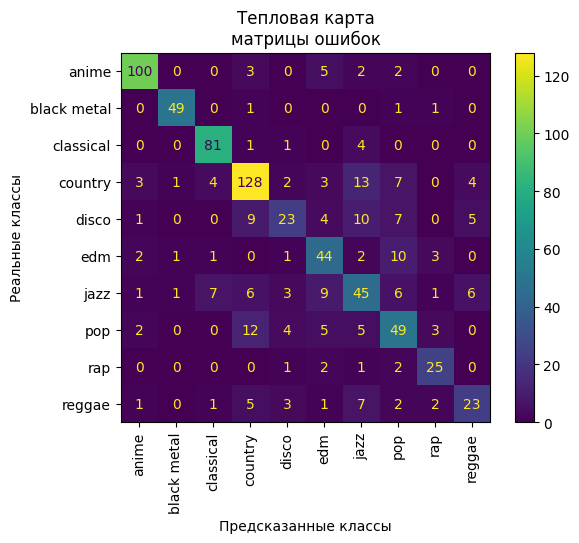

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix(targs, pred_indices),
                              display_labels=genres)

disp.plot()
plt.title('Тепловая карта\nматрицы ошибок')
plt.xticks(rotation='vertical')
plt.xlabel('Предсказанные классы')
plt.ylabel('Реальные классы')
plt.show()

- Для алгоритма всё ещё представляет некоторую сложность жанр `country`: из 165 изображений 13 относятся к жанру `jazz`, 7 &mdash; к жанру `pop`. С другой стороны, метка `country` выставляется изображения жанров `jazz` (6), `pop` (12) и `disco` (9).
- Кроме того, метка `pop` выставляется жанрам `disco` (7) и `edm` (10).
- Жанр `reggae` стал распознаваться лучше, хоть и остаются изображения, отмечаемые алгоритмом другими метками: например `jazz` (7), `country` (5). Но сама метка `reggae` ошибочно выставляется только трём жанрам: `jazz` (6), `country` (4), `disco` (5).
- Лучше стал распознаваться жанр `rap`, несмотря на то, что он хуже всего представлен в обучающей выборке. Изображения этого жанра ещё ошибочно могут быть отнесены к жанрам `disco`, `edm`, `jazz`, `pop`. А метка `rap` может быть ошибочно выставлена изображениям жанров `edm`, `jazz`, `pop` и `black metal`.
- Сохраняются некоторые сложности с распознаванием изображений жанра `jazz`: изображениям этого жанра алгоритм может ошибочно выставить любые другие метки, но наиболее часто это `edm`, `classical`, `country`, `pop`, `reggae`. И, наоборот, наиболее часто ошибочно метка `jazz` также выставляется этим жанрам.
- Лучше всего классифицируются изображения жанров `anime`, `black metal`, `classical`.
- Изображения жанра `classical` алгоритм чаще всего путает с изображениями жанра `jazz`.
- Некоторые изображения жанра `anime` редко, но всё ещё могут быть спутаны с изображениями  других жанров. Наиболее часто алгоритм их путает с изображениями жанра `edm`.
- Лучше всего распознаются изображения жанра `black metal`. Только 3 изображения из 52 были отнесены к другим жанрам, и только 3 изображения других жанров были отмечены как `black metal`.

## Общий вывод

1. Сформирован набор данных с извлечёнными признаками из файлов изображений, проведён их описательный анализ  и выполнена предобработка данных: обработаны аномальные значения, обнаружены и удалены частичные дубликаты &mdash; записи, для которых однозначно не определён музыкальный жанр.
2. Выбраны метрики классификации: правильность, точность, полнота и F1-мера. Основной метрикой выбрана правильность, поскольку она отражает общую способность обученных алгоритмов правильно классифицировать изображения.
3. В данных были выделены обучающая и тестовая выборки. Размер тестовой выборки выбран равным 780 &mdash; 10 % от исходного набора данных. Размер валидационной выборки выбирался равным размеру тестовой выборки.
4. Для сравнения алгоритмов была обучена простая модель (baseline). В качестве простой модели использовалась модель поиска одного ближайшего соседа, которая была реализована средствами библиотеки faiss. Правильность на тестовой выборке составила 0,44.
5. Для целей предсказания музыкального жанра компакт-диска по изображению его обложки были обучены нейронные сети на основе архитектур ResNet средствами библиотеки fastai:
- ResNet18,
- ResNet34,
- ResNet50,
- ResNet101,
- ResNet152.
6. Критерием отбора моделей было значение правильности, полученной в результате проведения кросс-валидации при подборе значений параметров модели.
7. Для подбора гиперпараметров была выбрана модель на основе архитектуры ResNet50. Был осуществлён выбор
- скорости обучения (из значений 5$\cdot$10$^{-4}$, 2$\cdot$10$^{-3}$, 1$\cdot$10$^{-2}$),
- вариантов использования аугментации (по умолчанию и с добавленным двугранным переворотом, с добавленным изменением размера изображений до 224 пикселей или с добавленным изменением размера изображения сначала до 460 пикселей, а затем до 224 пикселей),
- количества эпох обучения (из значений 10, 20, 30),
- функции потерь (из функций кросс-энтропии, кросс-энтропии со сглаженными метками, фокусирующей функции потерь),
- количества замороженных слоёв.
8. Наилучшие показатели качества демонстрирует модель ResNet50, дообученная в течение 20 эпох на изображениях с применённой аугментацией при скорости обучения 1$\cdot$10$^{-2}$, фокусирующей функцией потерь с параметром фокусировки равным 2 и тремя замороженными нижними слоями нейросети. Правильность на валидационной выборке достигает значений 0,727&ndash;0,736. Значение правильности на тестовой выборке равно 0,727.

**Рекомендации по развитию проекта**

Для дальнейшего развития проекта рекомендуется:
- собрать больше обучающих примеров (возможно, сбалансировать выборку),
- добавить в данные примеры обложек компакт-дисков других музыкальных жанров,
- доисследовать поведение более сложных архитектур, например ResNet101, ResNet152, особенно в случае увеличения числа обучающих примеров,
- исследовать другие архитектуры нейронных сетей для выполнения задачи классификации изображений по музыкальным жанрам,
- исследовать влияние на качество предсказания изменения значений гиперпараметров: например оптимизатора, функции потерь, скорости обучения, а также начальной и конечной скоростей обучения цикла, импульсов обучения, размера порции (батча) загружаемых изображений, различных типов аугментации помимо тех, что были использованы в проекте,
- отсеить примеры, на которых модель больше всего ошибается,
- исследовать зависимость качества предсказания от количества обучающих примеров, построить кривые обучения.